In [1]:
!nvidia-smi

Thu Mar  6 13:27:07 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.06              Driver Version: 555.42.06      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          On  |   00000000:41:00.0 Off |                    0 |
| N/A   25C    P0             61W /  500W |       1MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
!pip install transformers torch torchvision jsonlines

In [ ]:
!pip install -q git+https://github.com/huggingface/peft.git transformers bitsandbytes datasets

In [13]:
import os
import gc
import time

# https://huggingface.co/learn/cookbook/en/fine_tuning_vlm_trl
def clear_memory():
    if "inputs" in globals():
        del globals()["inputs"]
    if "model" in globals():
        del globals()["model"]
    if "processor" in globals():
        del globals()["processor"]
    if "trainer" in globals():
        del globals()["trainer"]
    if "peft_model" in globals():
        del globals()["peft_model"]
    if "bnb_config" in globals():
        del globals()["bnb_config"]
    time.sleep(2)

    gc.collect()
    time.sleep(2)
    torch.cuda.empty_cache()
    torch.cuda.synchronize()
    time.sleep(2)
    gc.collect()
    time.sleep(2)

    print(f"GPU allocated memory: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")
    print(f"GPU reserved memory: {torch.cuda.memory_reserved() / 1024**3:.2f} GB")


clear_memory()

GPU allocated memory: 66.99 GB
GPU reserved memory: 74.86 GB


In [1]:
from torch.utils.data import Dataset
from PIL import Image
import cv2
import os
import jsonlines
import os
import jsonlines
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torch
import numpy as np 
import matplotlib.pyplot as plt
import cv2
from transformers import BlipForConditionalGeneration, BlipProcessor, Blip2ForConditionalGeneration, AutoProcessor
from peft import LoraConfig, get_peft_model
from torch.utils.data import Dataset, DataLoader
from transformers import AddedToken

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("ybelkada/blip2-opt-2.7b-fp16-sharded", load_in_8bit=True)
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b", load_in_8bit=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# Let's define the LoraConfig
config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

model = get_peft_model(model, config)
model.print_trainable_parameters()

# processor.num_query_tokens = model.config.num_query_tokens
# image_token = AddedToken("<image>", normalized=False, special=True)
# processor.tokenizer.add_tokens([image_token], special_tokens=True)

# model.resize_token_embeddings(len(processor.tokenizer), pad_to_multiple_of=64) # pad for efficient computation
# model.config.image_token_index = len(processor.tokenizer) - 1

/cluster/home/ammaa/.conda/envs/ammars/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-03-06 02:56:07.359916: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-06 02:56:14.339452: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-06 02:57:05.776985: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [4]:
# Load the saved model state.
model.load_state_dict(torch.load('/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/blip_best_model_.pth', map_location=device))

<All keys matched successfully>

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
import cv2

def display_generated_captions():
    validation_imgs = os.listdir("/cluster/home/ammaa/Downloads/report_generation/test")

    for i, img in enumerate(validation_imgs):
        image_path = f"/cluster/home/ammaa/Downloads/report_generation/test/{img}"
        # image = Image.open(image_path).convert("RGB")
        img = cv2.imread(image_path)
        img = img[:, :, ::-1] # BGR to RGB.
        image = Image.fromarray(img)
        # Process the image and generate a caption
        inputs = processor(images=image, return_tensors="pt").to(device)
        out = model.generate(**inputs,max_new_tokens=100)

        # Decode and print the caption
        caption = processor.decode(out[0], skip_special_tokens=True)
        # print("Generated Caption:", caption)

        # Display the image and caption
        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.title(f"Generated Caption: {caption}", fontsize=14)
        plt.axis('off')
        plt.show()

        if i == 5: break


display_generated_captions()

Image Path: /cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val/17416-7-Frontal-AP-47.0-Male-Other.png


Both `max_new_tokens` (=72) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


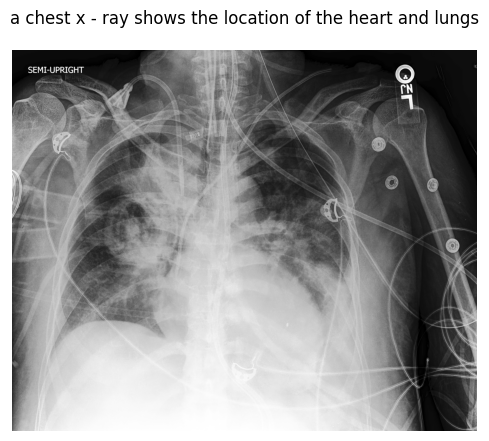

'a chest x - ray shows the location of the heart and lungs\n'

In [ ]:
import random 
import numpy as np 
import matplotlib.pyplot as plt
import cv2

root_dir = "/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val"
val_dir = os.listdir(root_dir)
num_of_images = len(val_dir)

root_dir = "/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val"
val_dir = os.listdir(root_dir)
num_of_images = len(val_dir)


num_tokens = 72

def generate_rand():
    index = random.randint(0, num_of_images - 1)  # Fix index range
    image_path = os.path.join(root_dir, val_dir[index])
    print("Image Path:", image_path)
    img = cv2.imread(image_path)
    img = img[:, :, ::-1] # BGR to RGB.
    image = Image.fromarray(img)
    # Process the image and generate a caption
    inputs = processor(images=image, return_tensors="pt").to(device)
    out = model.generate(**inputs,max_new_tokens=num_tokens)

    # Decode and print the caption
    caption = processor.decode(out[0], skip_special_tokens=True)

    # Plot Image with Caption
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(caption, fontsize=12, wrap=True)
    plt.show()

    return caption

generate_rand()

In [ ]:
class ImageCaptioningDataset(Dataset):
    def __init__(self, image_folder, jsonl_file, processor):
        self.image_folder = image_folder
        self.processor = processor
        self.data = []

        # Load jsonl data
        with jsonlines.open(jsonl_file) as reader:
            for obj in reader:
                self.data.append(obj)

    def __len__(self):
        return len(self.data)

    # def __getitem__(self, idx):
    #     item = self.data[idx]
    #     image_path = os.path.join(self.image_folder, item['image'] + '.png')
    #     img = cv2.imread(image_path)
    #     img = img[:, :, ::-1]  # BGR to RGB.
    #     image = Image.fromarray(img)
    #     caption = item['suffix']

    #     encoding = self.processor(images=image, padding="max_length", return_tensors="pt")
    #     # remove batch dimension
    #     encoding = {k: v.squeeze() for k, v in encoding.items()}
    #     encoding["text"] = caption
    #     return encoding

    def __getitem__(self, idx):
        item = self.data[idx]
        image_path = os.path.join(self.image_folder, item['image'])
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # BGR to RGB conversion
        
        # Resize image to reduce memory usage
        image = cv2.resize(img, (224, 224))  # Resize to 224x224 or another reasonable size
        image = Image.fromarray(image)

        caption = item['suffix']

        encoding = self.processor(images=image, padding="max_length", return_tensors="pt")
        
        # Remove batch dimension
        encoding = {k: v.squeeze() for k, v in encoding.items()}
        encoding["text"] = caption
        return encoding


def collate_fn(batch):
    # pad the input_ids and attention_mask
    processed_batch = {}
    for key in batch[0].keys():
        if key != "text":
            processed_batch[key] = torch.stack([example[key] for example in batch])
        else:
            text_inputs = processor.tokenizer(
                [example["text"] for example in batch], padding=True, return_tensors="pt"
            )
            processed_batch["input_ids"] = text_inputs["input_ids"]
            processed_batch["attention_mask"] = text_inputs["attention_mask"]
    return processed_batch


batch_size = 16
# Initialize Dataset
train_ds = ImageCaptioningDataset(image_folder="/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/train", jsonl_file="/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/train.jsonl", processor=processor)
val_ds = ImageCaptioningDataset(image_folder="/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val", jsonl_file="/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val.jsonl", processor=processor)

train_dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, collate_fn=collate_fn, pin_memory=True, num_workers=2)
eval_dataloader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

train_data_size = train_dataloader.dataset
eval_data_size = eval_dataloader.dataset
print(len(train_data_size), len(eval_data_size))

28187 8055


Epoch: 0


0/4604 Batch Processed. Loss: 4.78515625


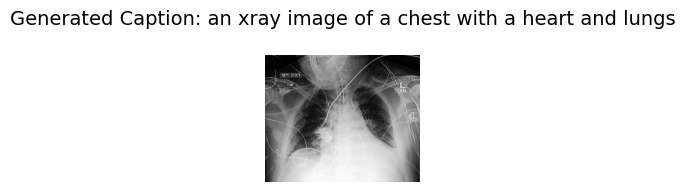

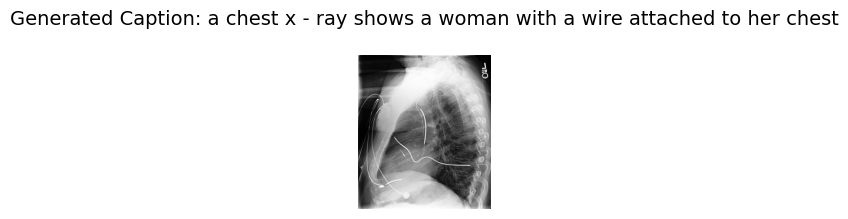

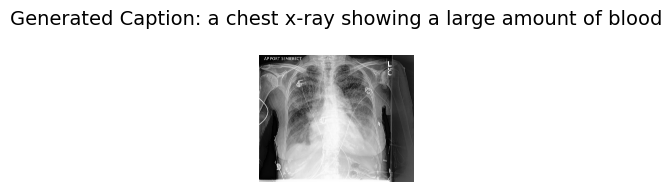

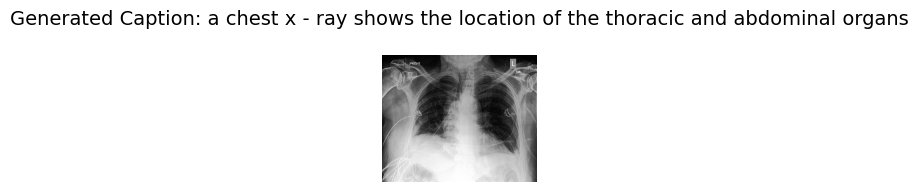

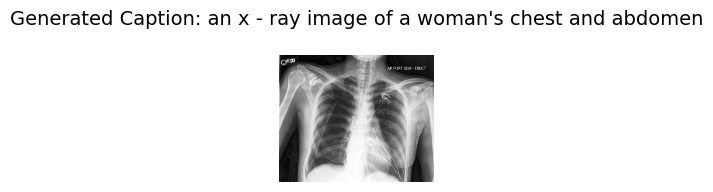

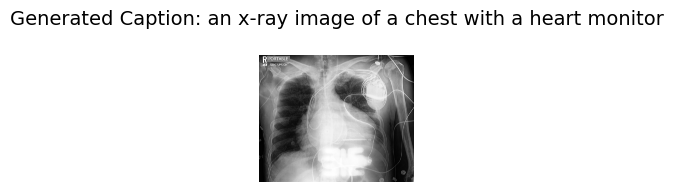

1/4604 Batch Processed. Loss: 4.546875


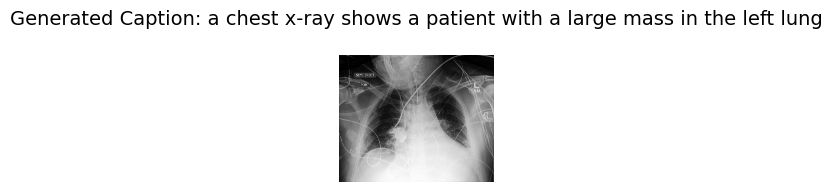

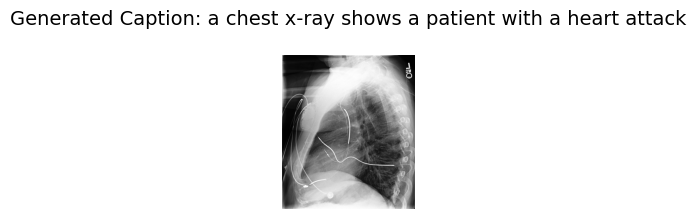

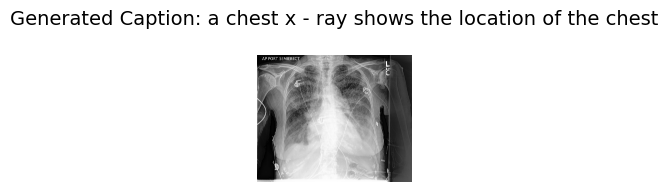

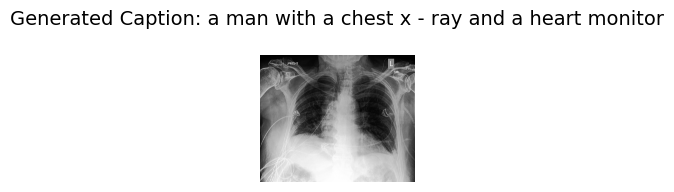

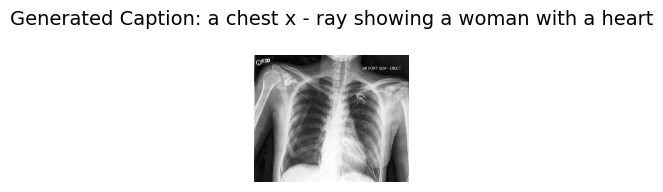

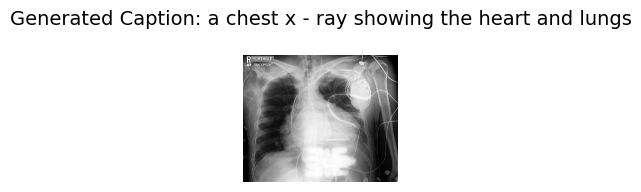

2/4604 Batch Processed. Loss: 4.53125


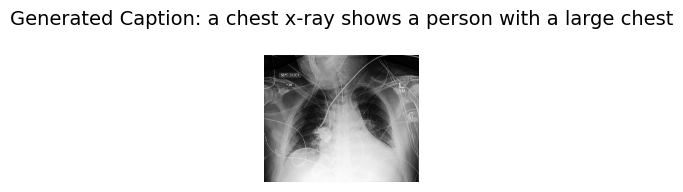

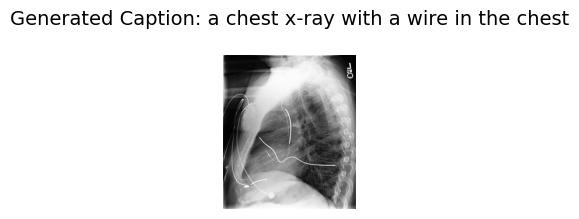

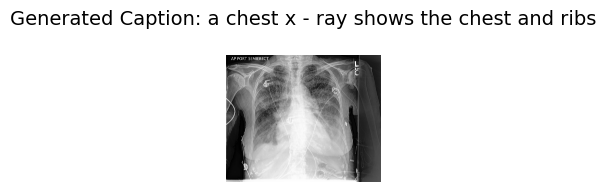

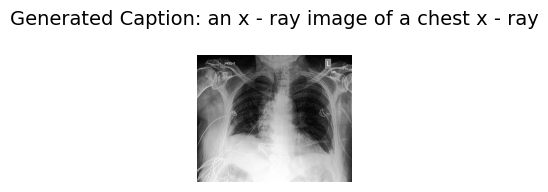

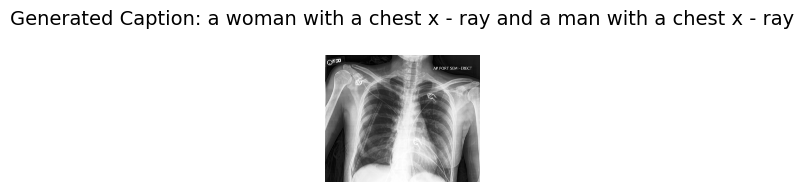

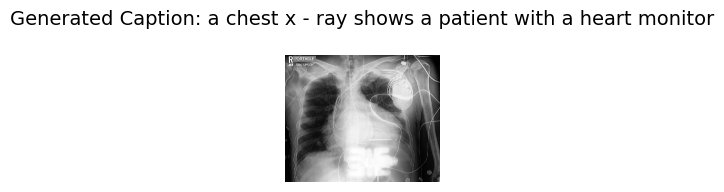

3/4604 Batch Processed. Loss: 4.1796875


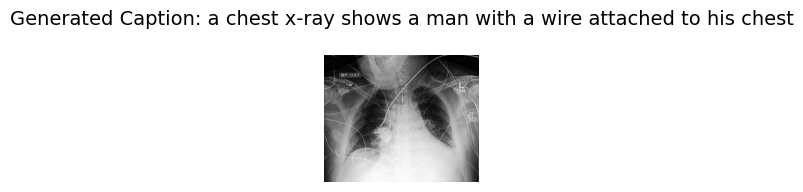

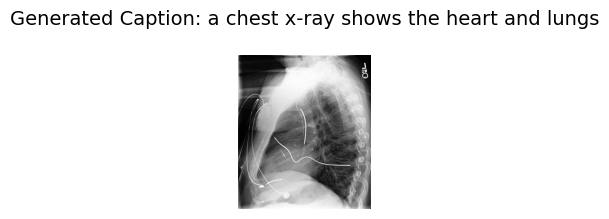

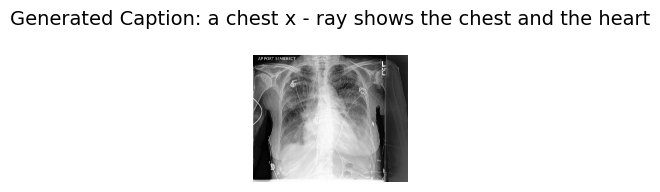

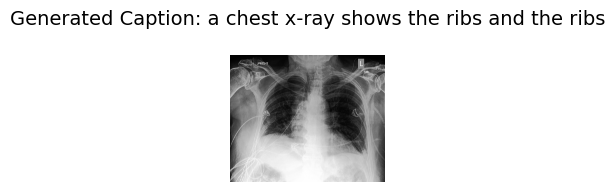

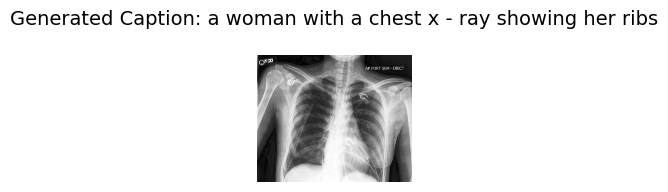

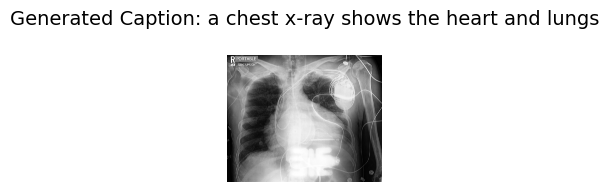

4/4604 Batch Processed. Loss: 3.984375


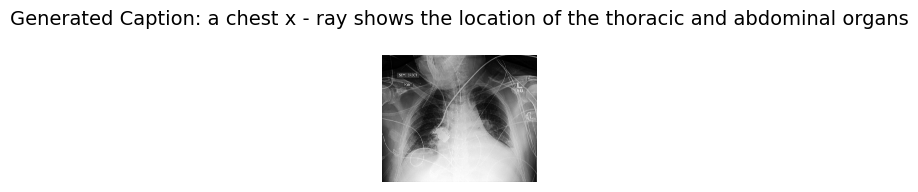

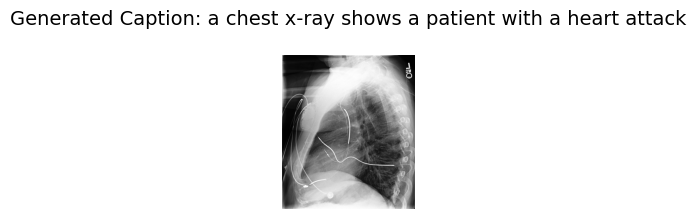

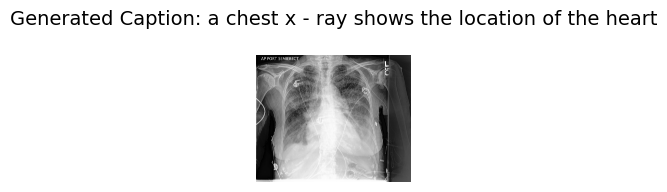

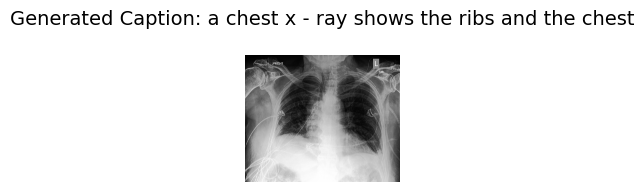

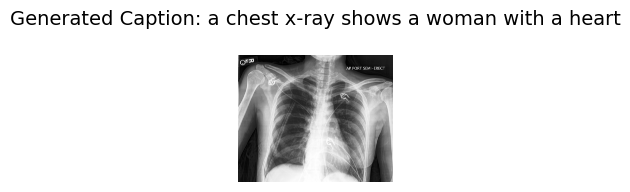

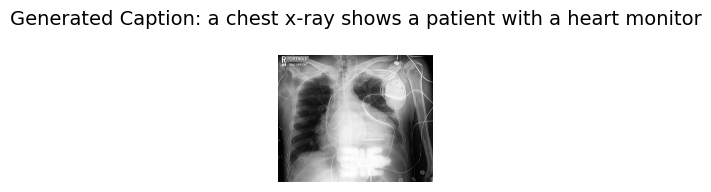

5/4604 Batch Processed. Loss: 4.046875


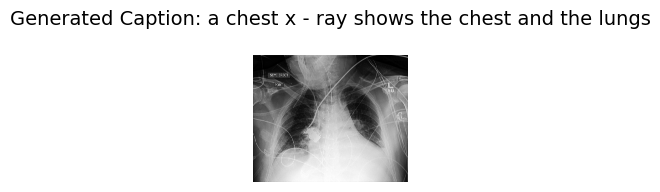

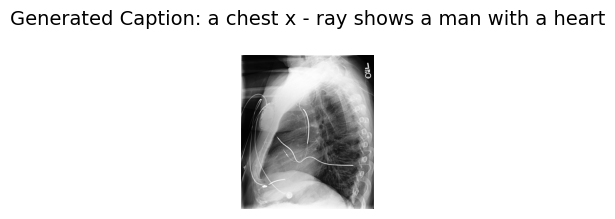

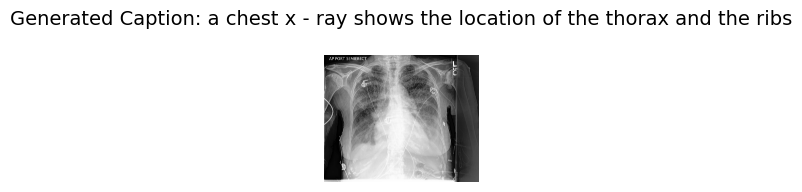

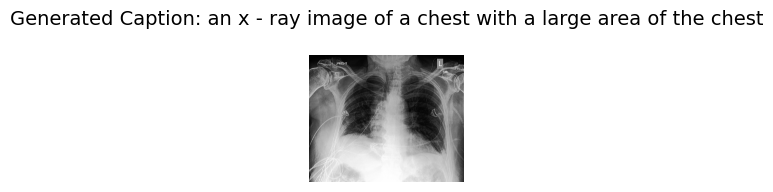

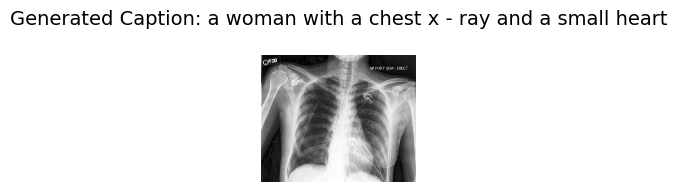

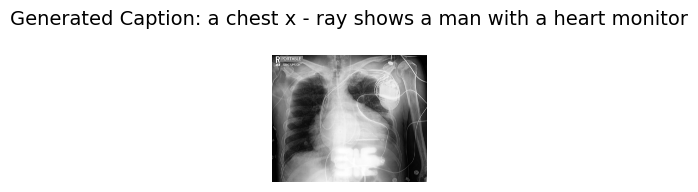

6/4604 Batch Processed. Loss: 4.0546875


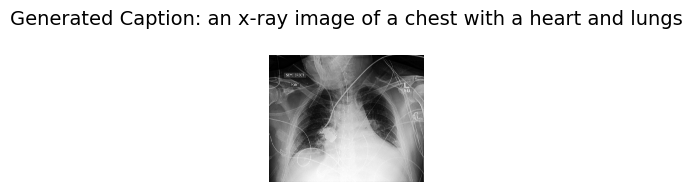

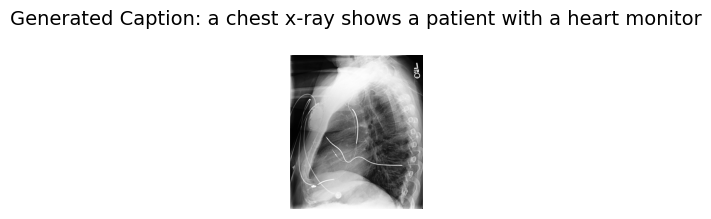

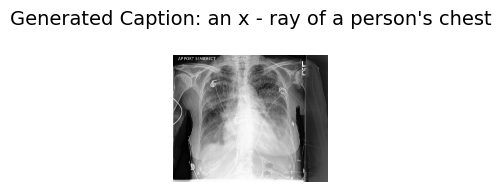

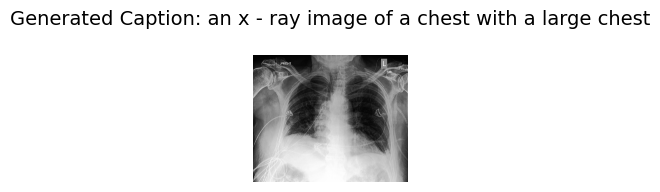

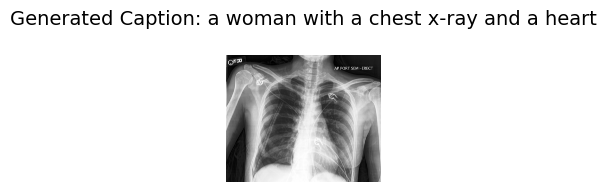

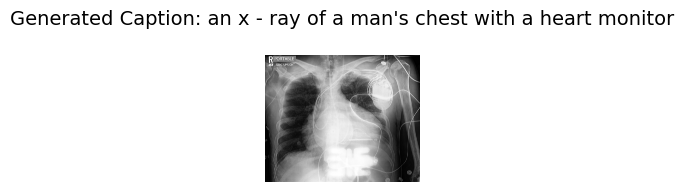

7/4604 Batch Processed. Loss: 3.94140625


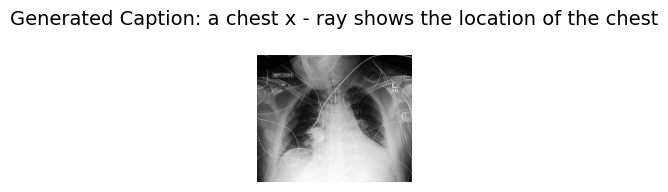

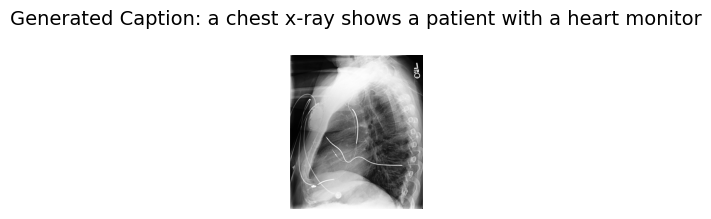

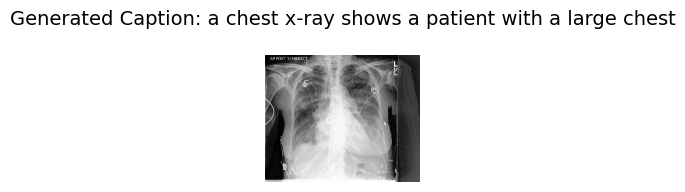

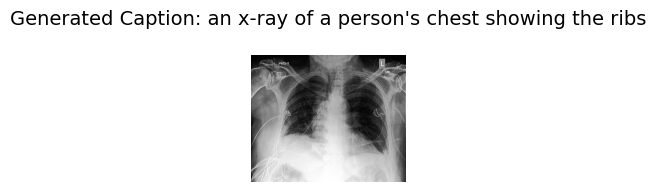

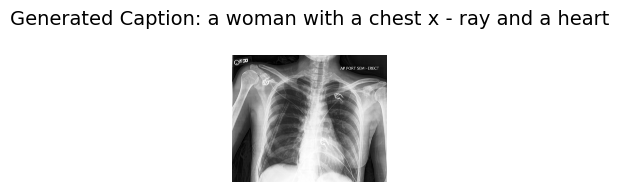

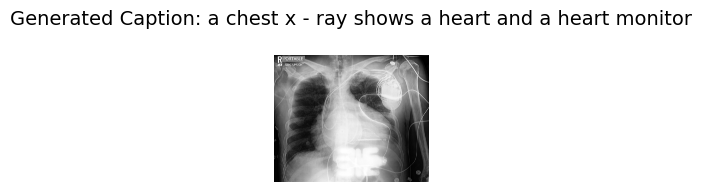

8/4604 Batch Processed. Loss: 3.8046875


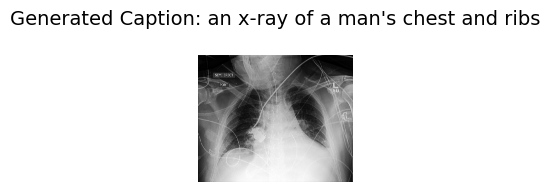

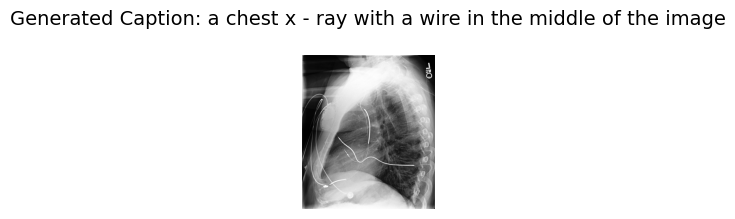

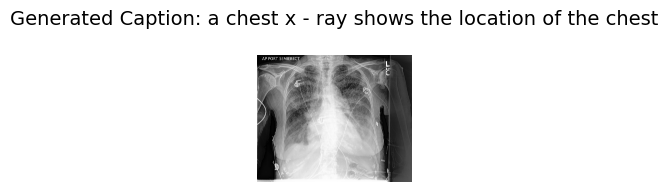

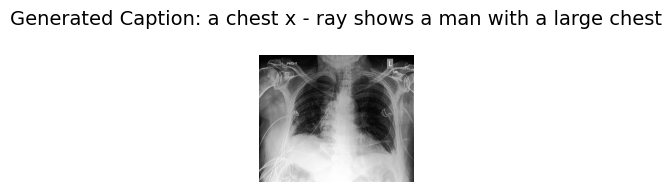

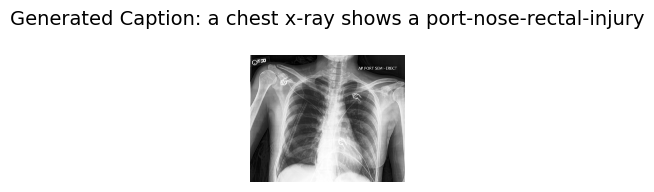

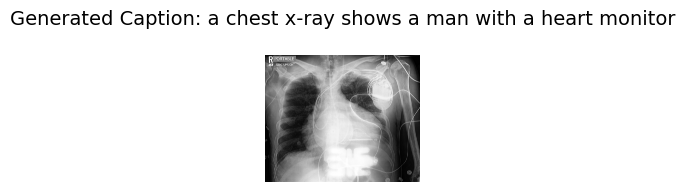

9/4604 Batch Processed. Loss: 3.57421875


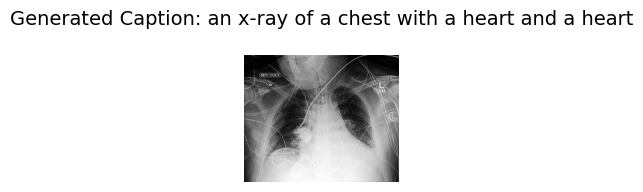

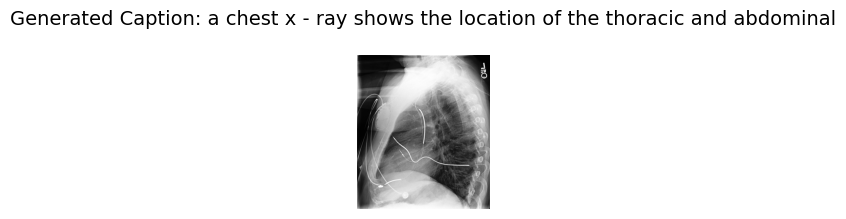

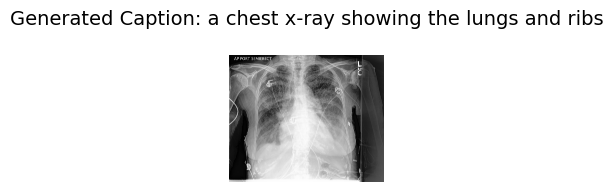

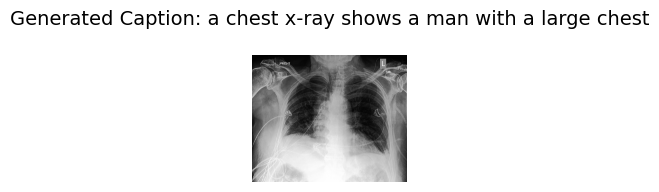

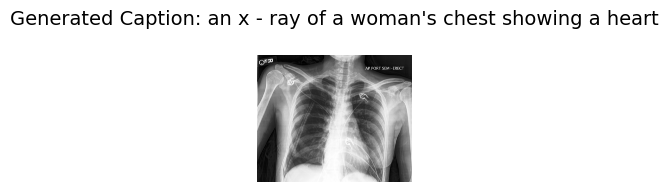

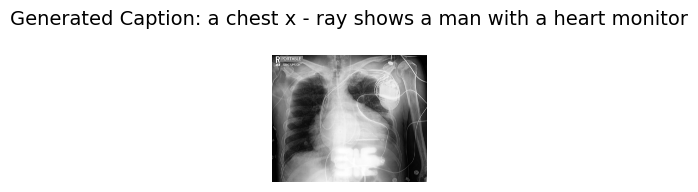

10/4604 Batch Processed. Loss: 3.62890625


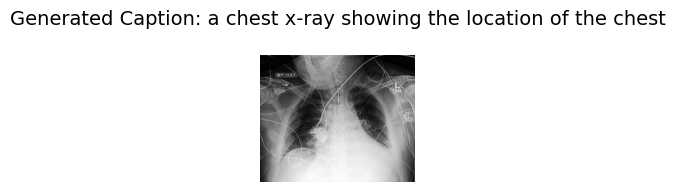

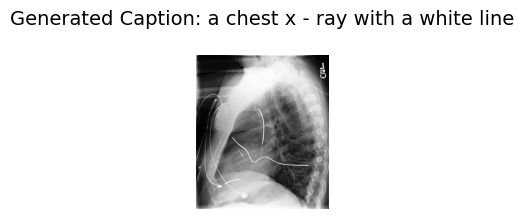

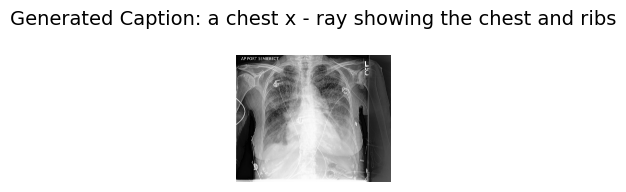

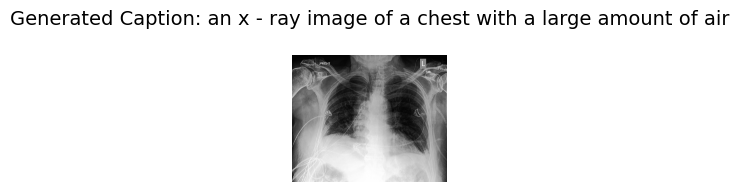

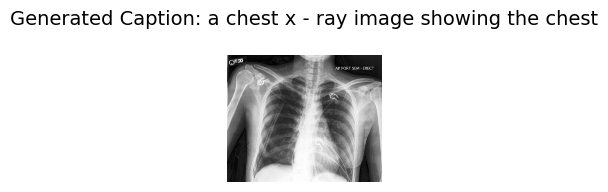

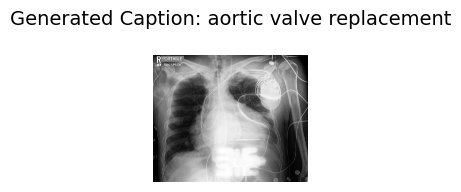

11/4604 Batch Processed. Loss: 3.416015625


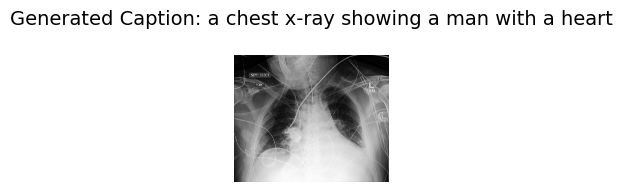

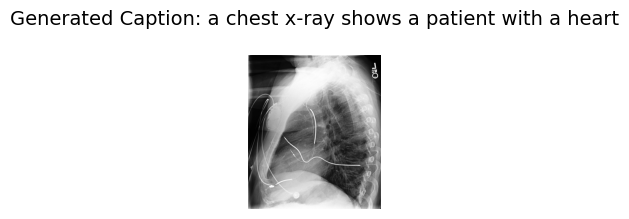

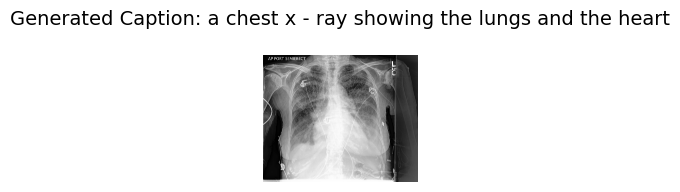

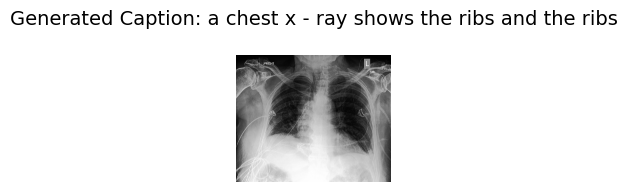

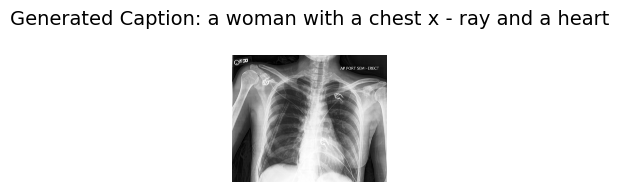

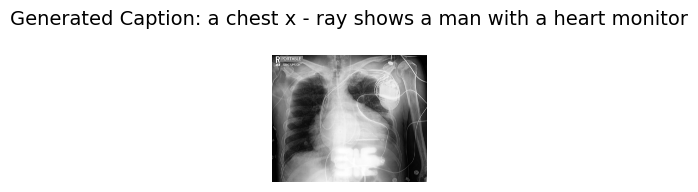

12/4604 Batch Processed. Loss: 3.5625


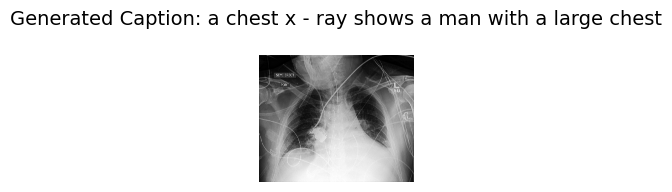

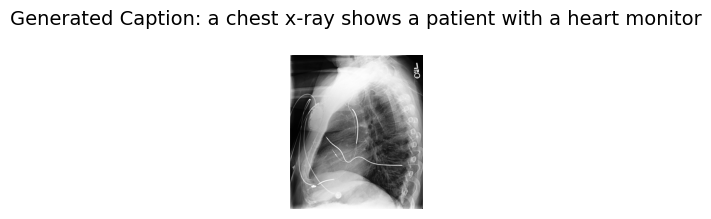

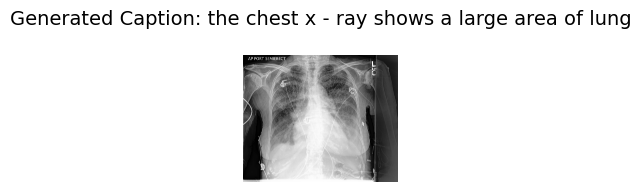

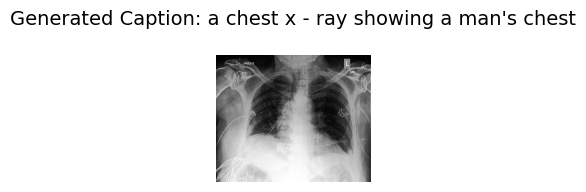

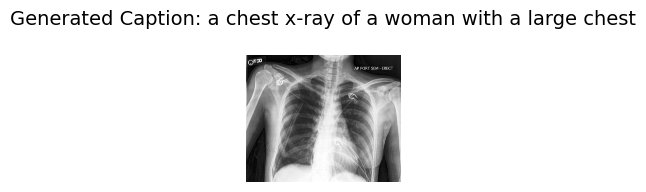

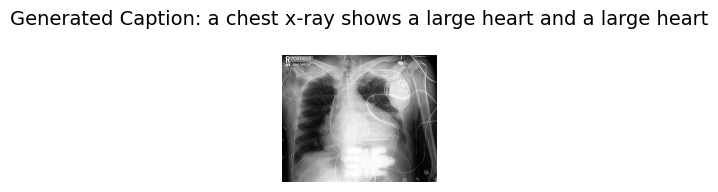

13/4604 Batch Processed. Loss: 3.4296875


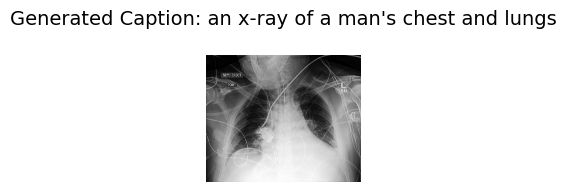

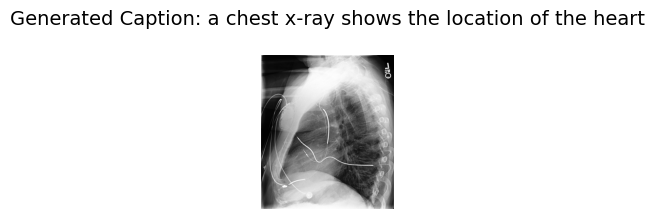

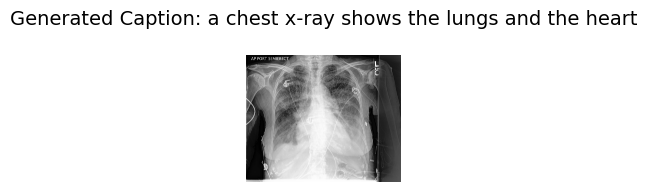

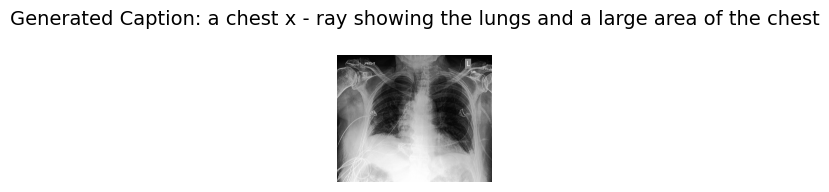

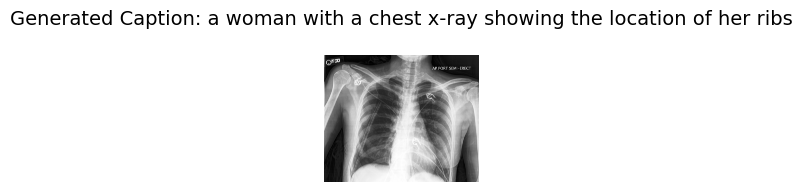

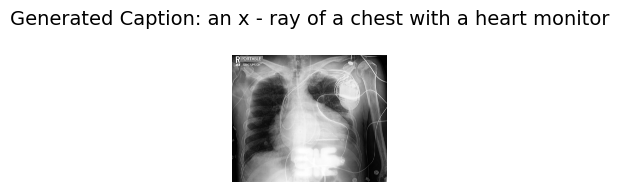

14/4604 Batch Processed. Loss: 3.544921875


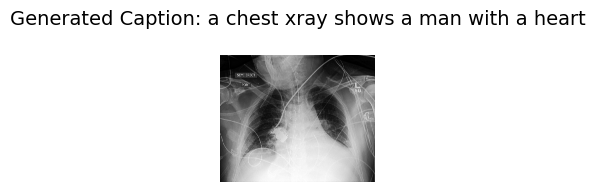

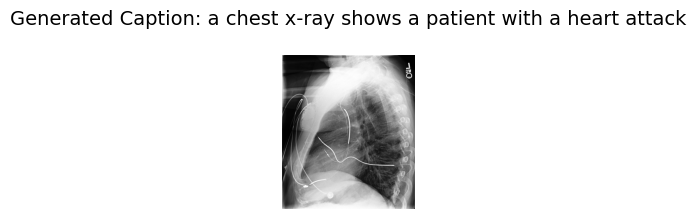

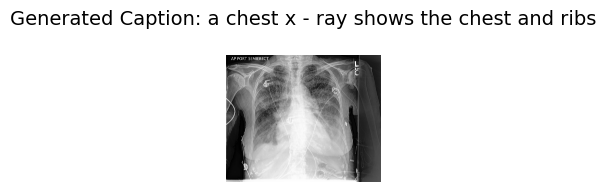

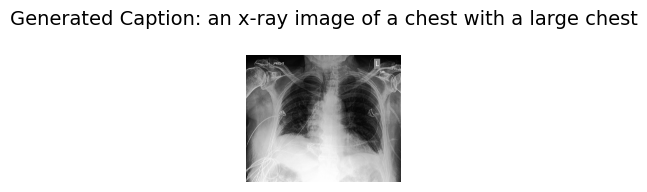

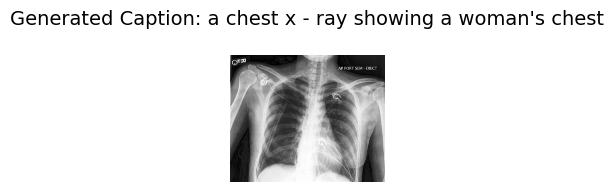

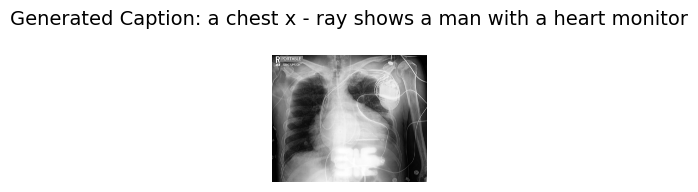

15/4604 Batch Processed. Loss: 3.5


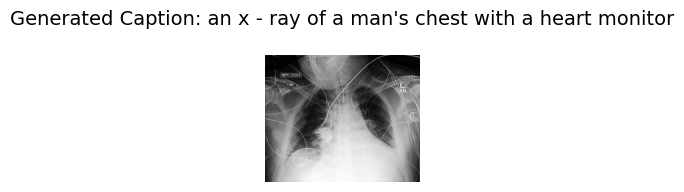

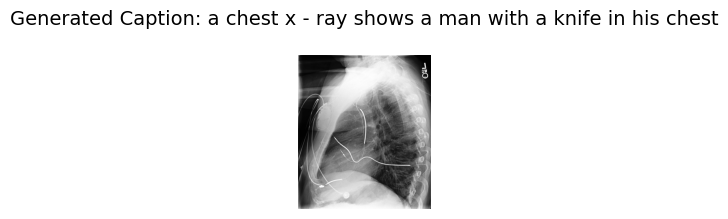

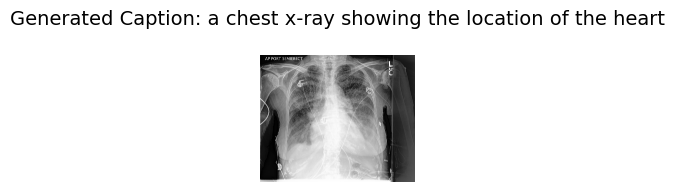

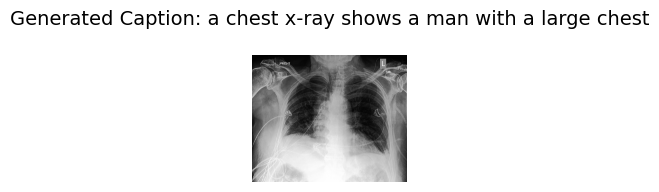

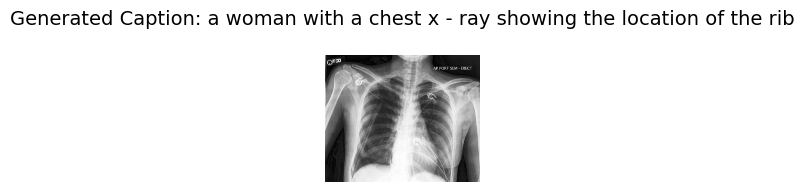

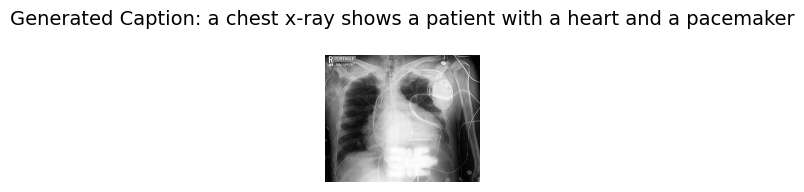

16/4604 Batch Processed. Loss: 3.4296875


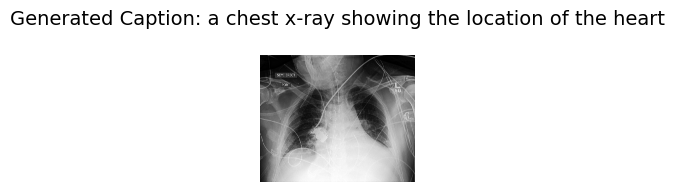

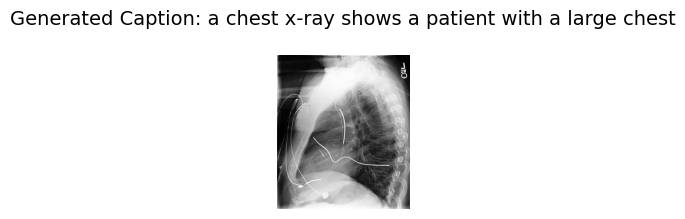

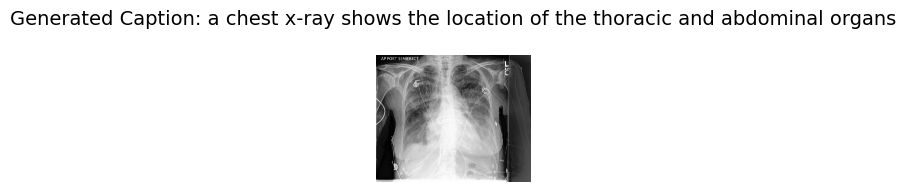

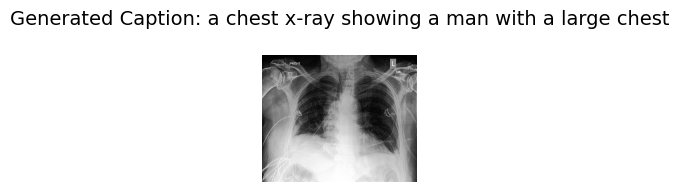

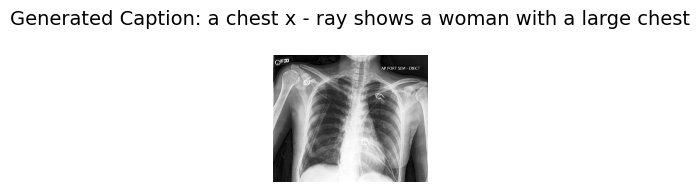

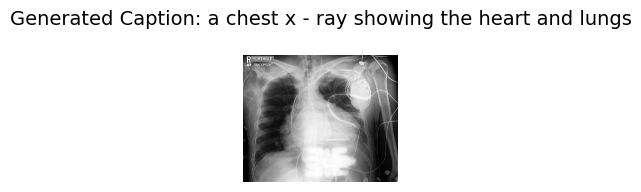

17/4604 Batch Processed. Loss: 3.537109375


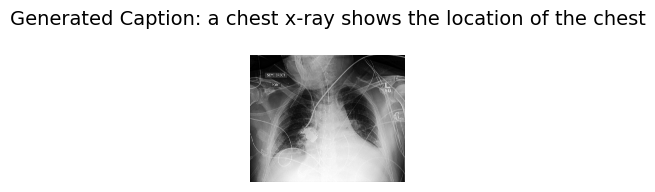

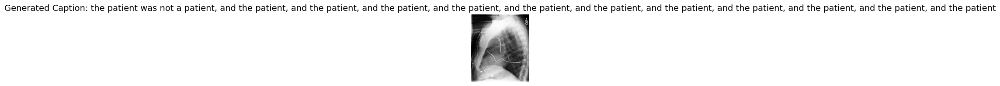

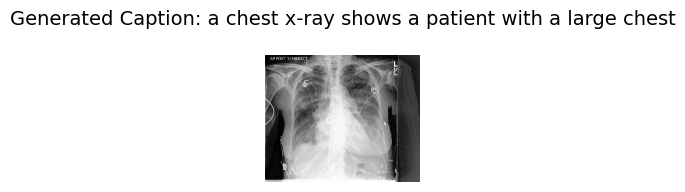

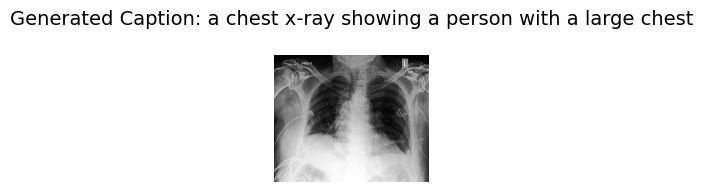

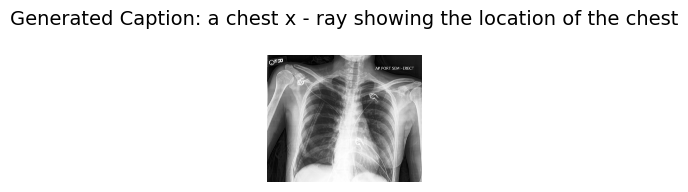

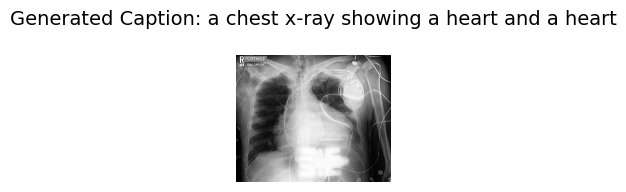

18/4604 Batch Processed. Loss: 3.232421875


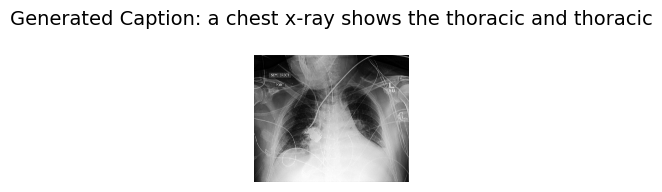

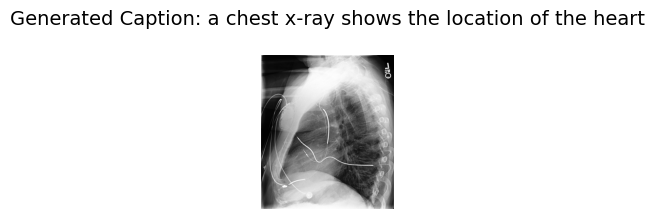

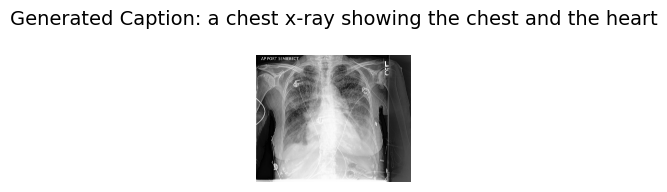

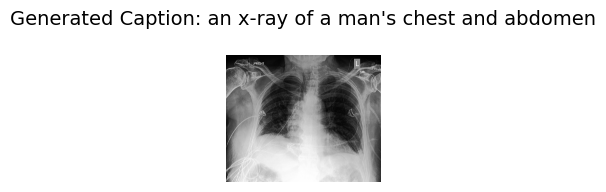

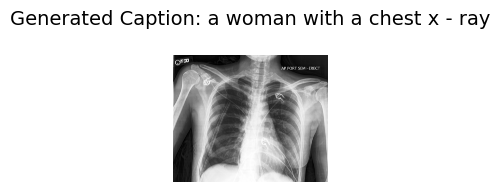

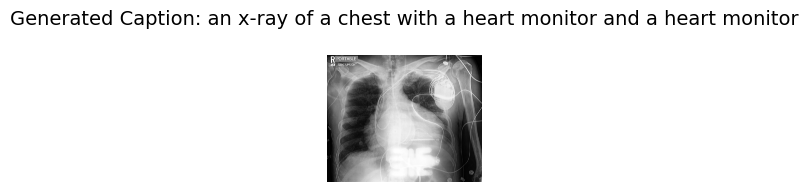

19/4604 Batch Processed. Loss: 3.18359375


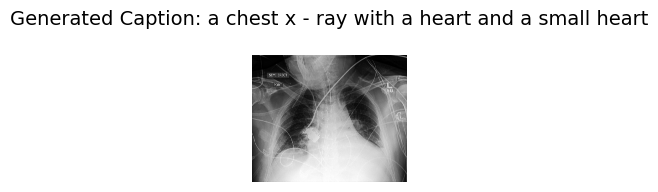

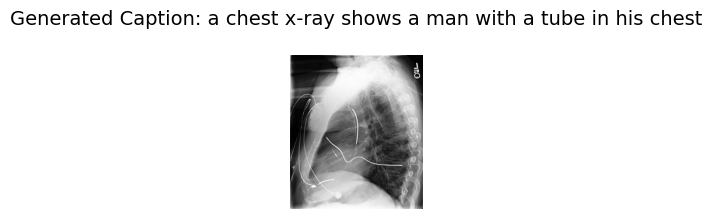

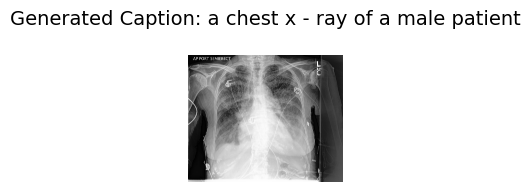

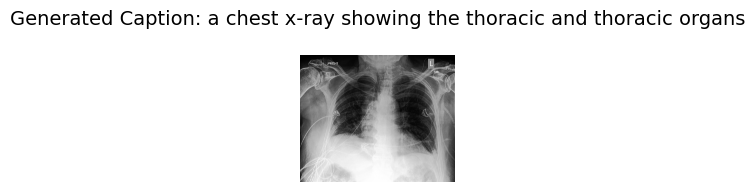

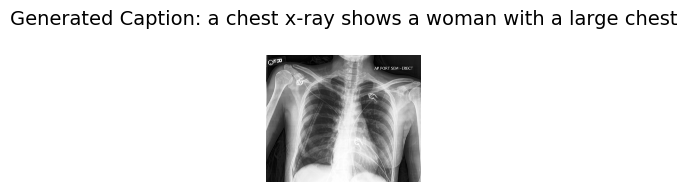

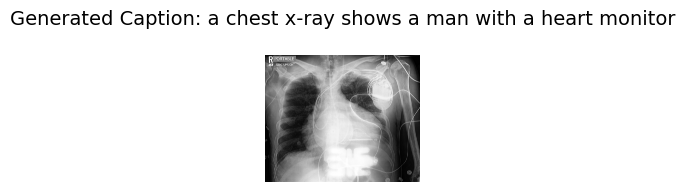

20/4604 Batch Processed. Loss: 3.005859375


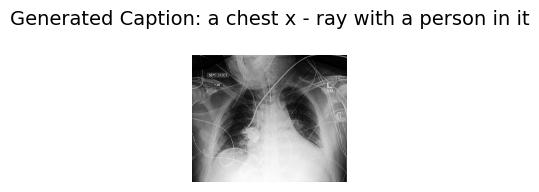

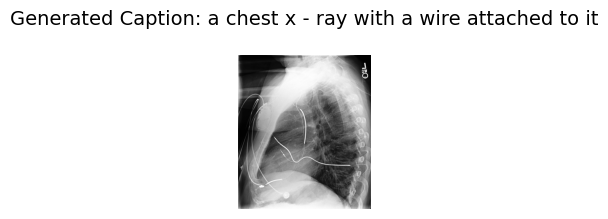

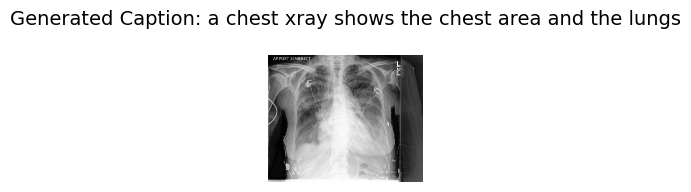

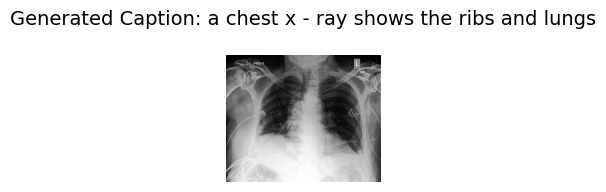

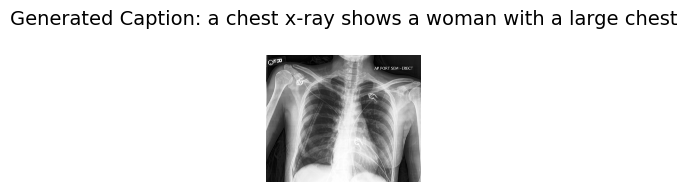

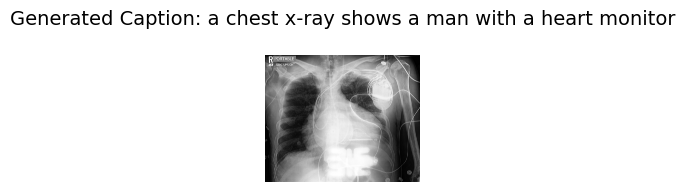

21/4604 Batch Processed. Loss: 3.169921875


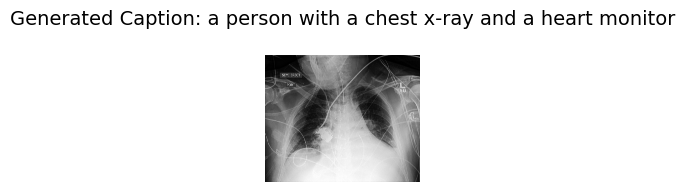

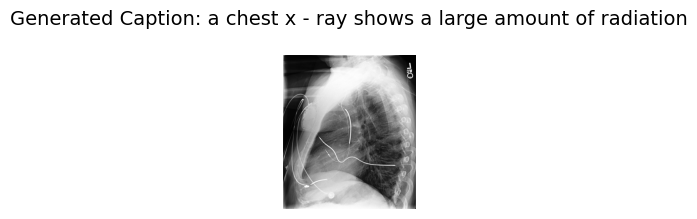

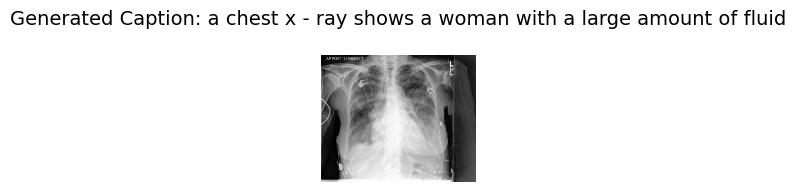

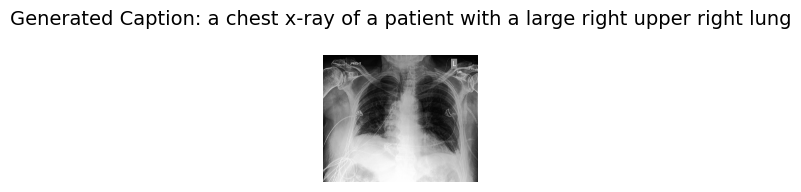

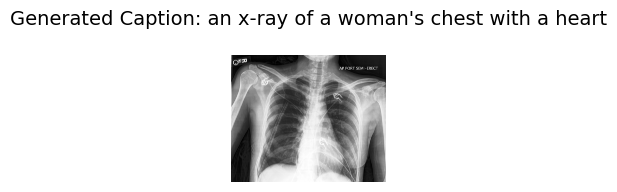

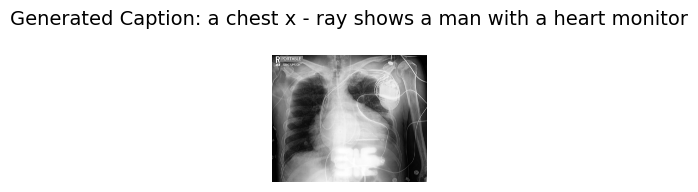

22/4604 Batch Processed. Loss: 3.31640625


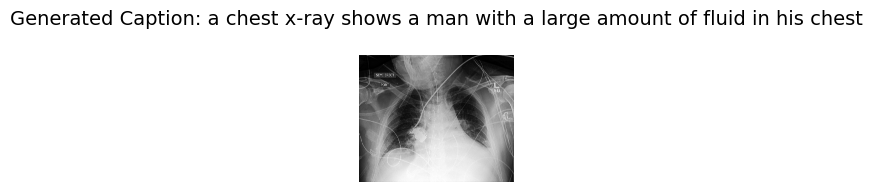

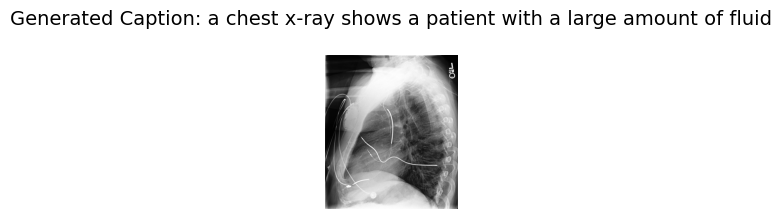

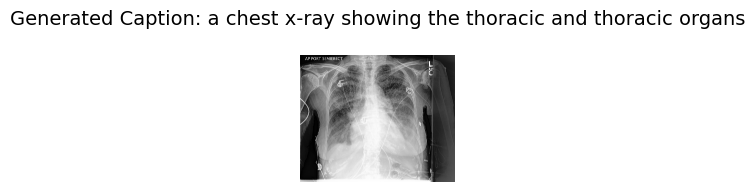

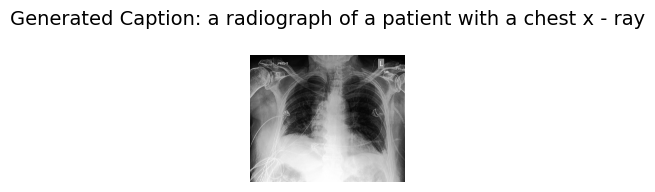

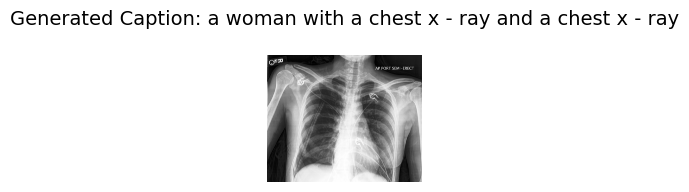

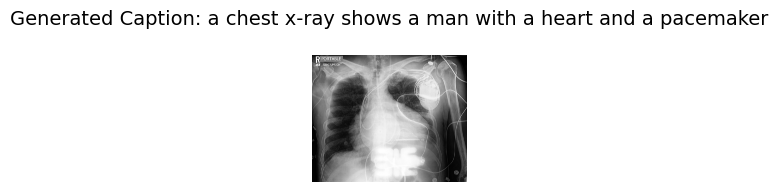

23/4604 Batch Processed. Loss: 3.265625


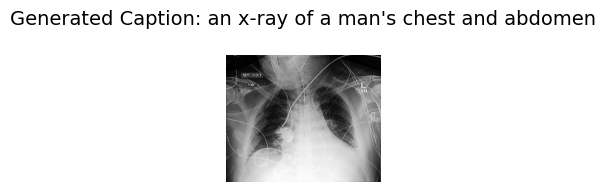

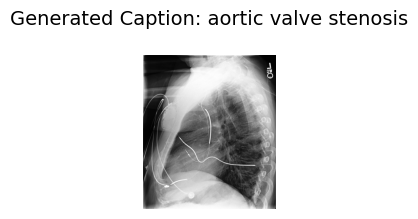

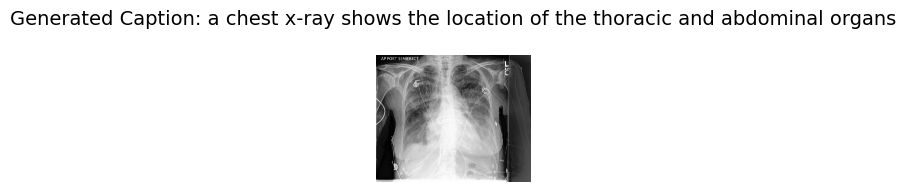

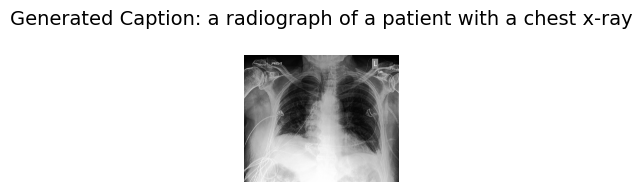

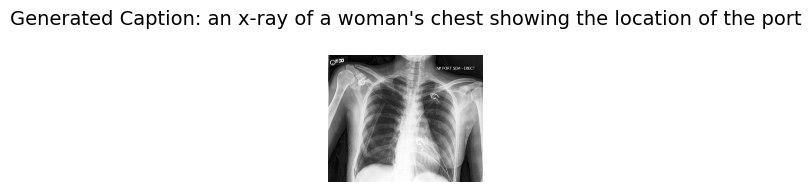

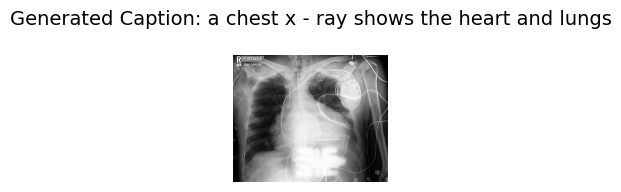

24/4604 Batch Processed. Loss: 3.140625


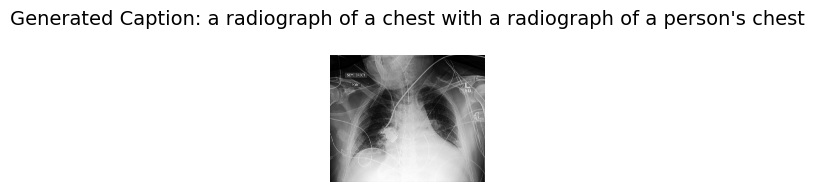

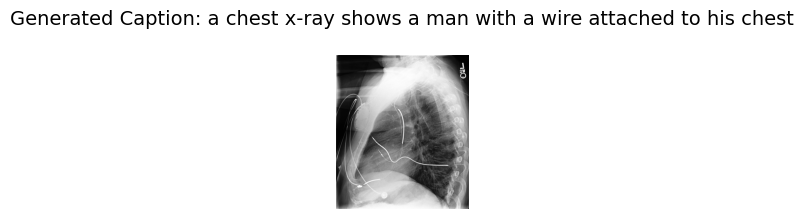

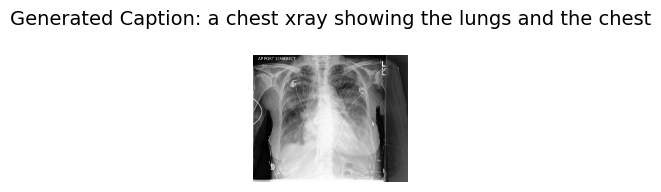

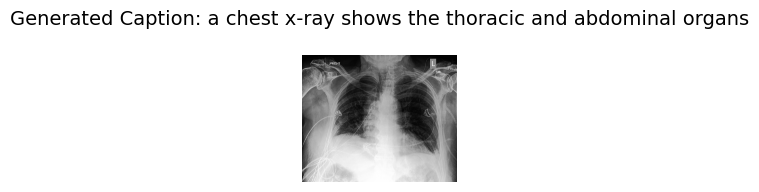

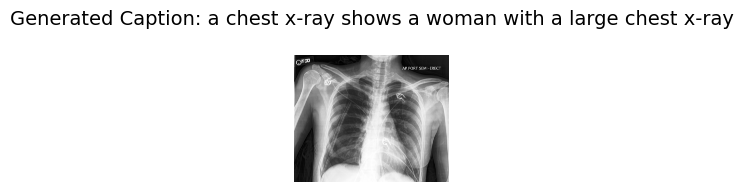

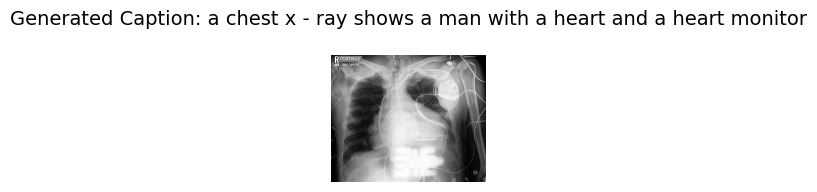

25/4604 Batch Processed. Loss: 3.103515625


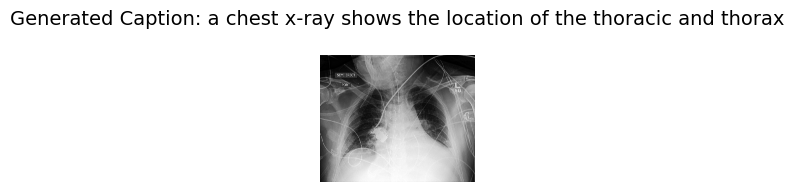

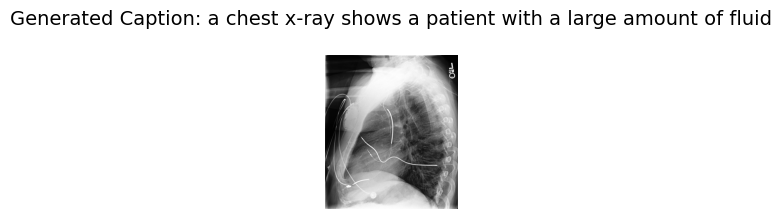

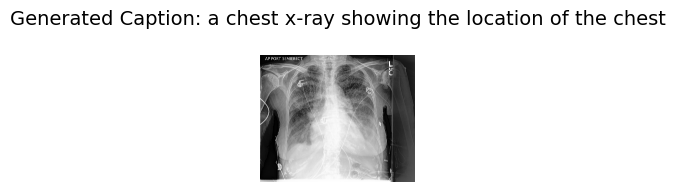

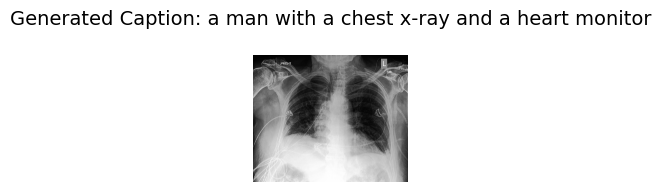

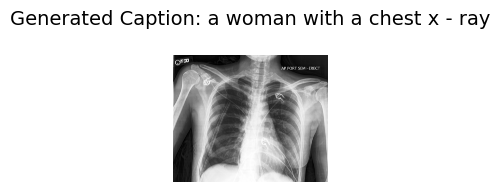

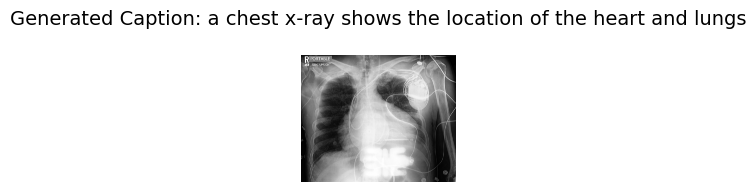

26/4604 Batch Processed. Loss: 2.962890625


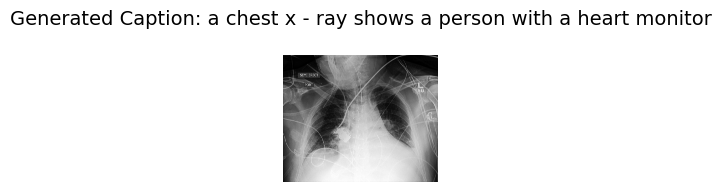

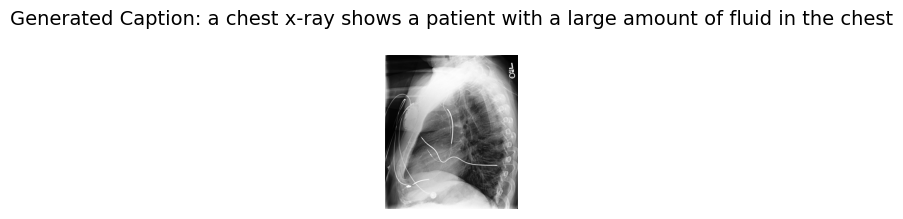

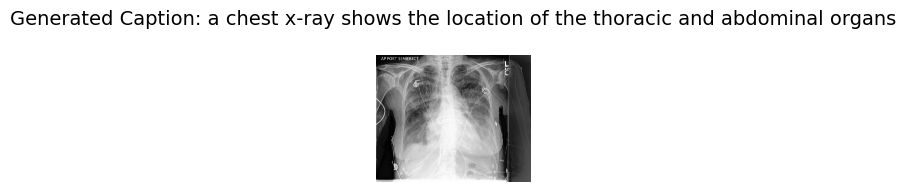

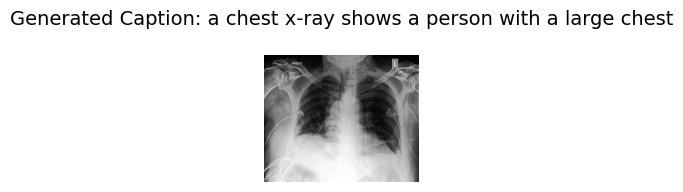

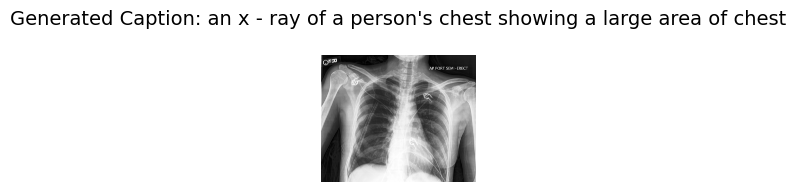

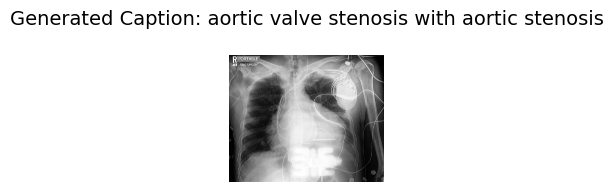

27/4604 Batch Processed. Loss: 3.140625


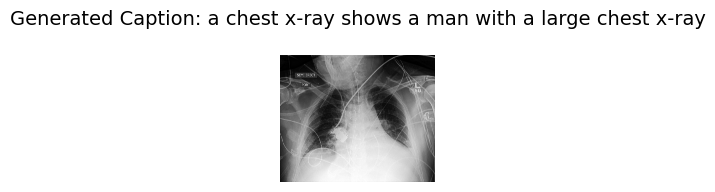

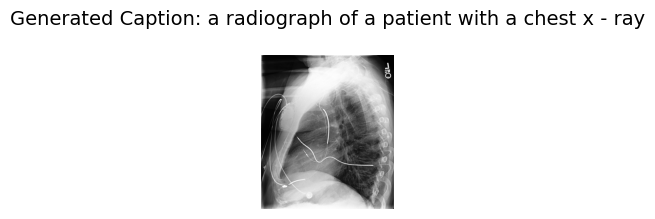

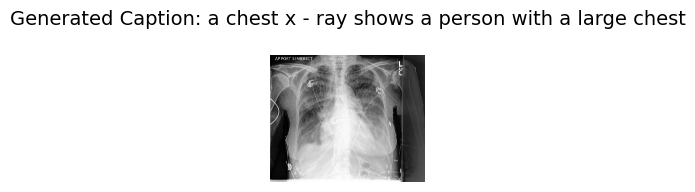

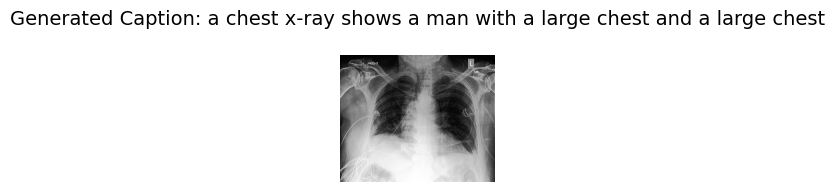

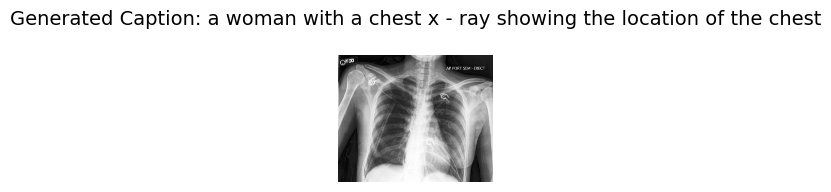

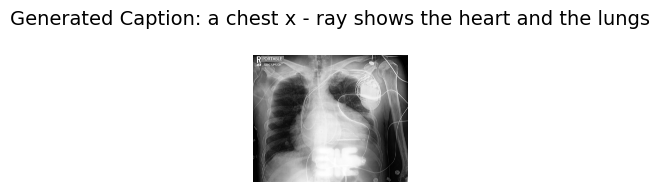

28/4604 Batch Processed. Loss: 2.923828125


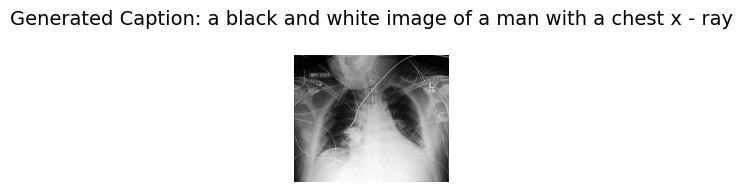

In [10]:
import torch
from tqdm import tqdm 

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
num_epochs = 9

best_val_loss = float('inf')
device = "cuda" if torch.cuda.is_available() else "cpu"

model.train()
eval_dataloader = train_dataloader

for epoch in range(num_epochs):
    print("Epoch:", epoch)
    for idx, batch in tqdm(enumerate(train_dataloader)):
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device, torch.float16)

        outputs = model(input_ids=input_ids,
        pixel_values=pixel_values,
        labels=input_ids)

        loss = outputs.loss

        print(f'{idx}/{24097//batch_size} Batch Processed. Loss: {loss.item()}')

        loss.backward()

        optimizer.step()
        optimizer.zero_grad()

        if (idx + 1) % 20 == 0:
            generate_rand()
        # display_generated_captions()

    # Evaluation phase
    model.eval()
    val_loss_sum = 0.0
    num_batches = 0
    with torch.no_grad():
        for batch in eval_dataloader:
            input_ids = batch.pop("input_ids").to(device)
            pixel_values = batch.pop("pixel_values").to(device, torch.float16)

            outputs = model(input_ids=input_ids,
                            pixel_values=pixel_values,
                            labels=input_ids)

            val_loss_sum += outputs.loss.item()
            num_batches += 1

    avg_val_loss = val_loss_sum / num_batches
    print(f"Validation Loss: {avg_val_loss}")

    # Save the best model based on validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print("Saved new best model.")


    # display_generated_captions()

print("Training complete.")

Epoch: 0


0it [00:00, ?it/s]

0/3012 Batch Processed. Loss: 5.5546875


2it [00:04,  1.80s/it]

1/3012 Batch Processed. Loss: 4.890625


3it [00:04,  1.24s/it]

2/3012 Batch Processed. Loss: 4.96875


4it [00:05,  1.07it/s]

3/3012 Batch Processed. Loss: 4.984375


5it [00:05,  1.26it/s]

4/3012 Batch Processed. Loss: 4.4921875


6it [00:06,  1.47it/s]

5/3012 Batch Processed. Loss: 4.69921875


7it [00:06,  1.76it/s]

6/3012 Batch Processed. Loss: 4.19921875


8it [00:06,  1.95it/s]

7/3012 Batch Processed. Loss: 4.13671875


9it [00:07,  1.94it/s]

8/3012 Batch Processed. Loss: 4.078125


10it [00:07,  1.95it/s]

9/3012 Batch Processed. Loss: 4.0859375


11it [00:08,  1.80it/s]

10/3012 Batch Processed. Loss: 4.12890625


12it [00:09,  1.87it/s]

11/3012 Batch Processed. Loss: 3.880859375


13it [00:09,  1.89it/s]

12/3012 Batch Processed. Loss: 3.86328125


14it [00:10,  2.03it/s]

13/3012 Batch Processed. Loss: 3.990234375


15it [00:10,  2.04it/s]

14/3012 Batch Processed. Loss: 3.544921875


16it [00:10,  2.13it/s]

15/3012 Batch Processed. Loss: 3.841796875


17it [00:11,  2.15it/s]

16/3012 Batch Processed. Loss: 3.666015625


18it [00:11,  2.13it/s]

17/3012 Batch Processed. Loss: 3.701171875


19it [00:12,  2.05it/s]

18/3012 Batch Processed. Loss: 3.453125
19/3012 Batch Processed. Loss: 3.322265625


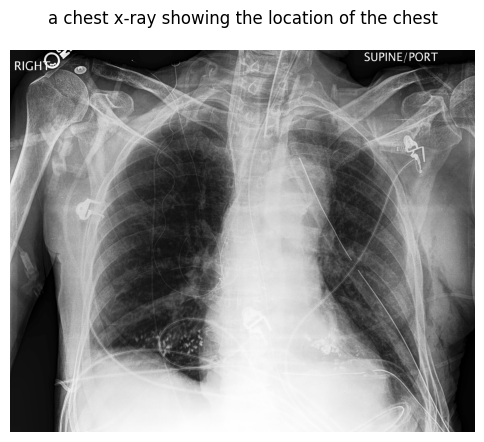

21it [00:15,  1.02it/s]

20/3012 Batch Processed. Loss: 3.25


22it [00:16,  1.19it/s]

21/3012 Batch Processed. Loss: 3.5234375


23it [00:16,  1.46it/s]

22/3012 Batch Processed. Loss: 3.41015625


24it [00:17,  1.59it/s]

23/3012 Batch Processed. Loss: 3.470703125


25it [00:17,  1.82it/s]

24/3012 Batch Processed. Loss: 3.556640625


26it [00:17,  2.01it/s]

25/3012 Batch Processed. Loss: 3.103515625


27it [00:18,  1.87it/s]

26/3012 Batch Processed. Loss: 3.4609375


28it [00:18,  1.94it/s]

27/3012 Batch Processed. Loss: 3.083984375


29it [00:19,  1.49it/s]

28/3012 Batch Processed. Loss: 3.052734375


30it [00:20,  1.61it/s]

29/3012 Batch Processed. Loss: 3.287109375


31it [00:20,  1.68it/s]

30/3012 Batch Processed. Loss: 3.255859375


32it [00:21,  1.75it/s]

31/3012 Batch Processed. Loss: 3.18359375


33it [00:22,  1.61it/s]

32/3012 Batch Processed. Loss: 3.005859375


34it [00:22,  1.71it/s]

33/3012 Batch Processed. Loss: 3.140625


35it [00:23,  1.58it/s]

34/3012 Batch Processed. Loss: 3.14453125


36it [00:23,  1.73it/s]

35/3012 Batch Processed. Loss: 2.83984375


37it [00:24,  1.76it/s]

36/3012 Batch Processed. Loss: 3.10546875


38it [00:25,  1.74it/s]

37/3012 Batch Processed. Loss: 2.943359375


39it [00:25,  1.69it/s]

38/3012 Batch Processed. Loss: 3.08984375
39/3012 Batch Processed. Loss: 2.642578125


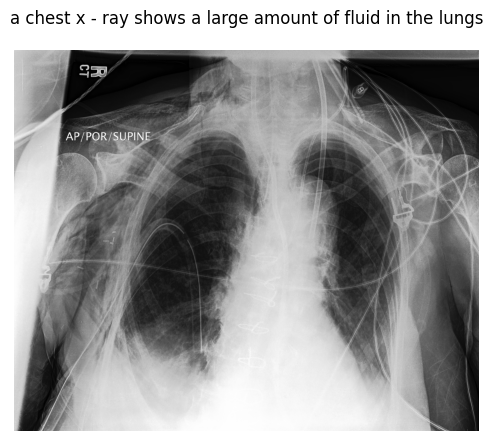

41it [00:29,  1.20s/it]

40/3012 Batch Processed. Loss: 2.833984375


42it [00:30,  1.00it/s]

41/3012 Batch Processed. Loss: 2.505859375


43it [00:30,  1.19it/s]

42/3012 Batch Processed. Loss: 3.041015625


44it [00:31,  1.31it/s]

43/3012 Batch Processed. Loss: 3.080078125


45it [00:32,  1.40it/s]

44/3012 Batch Processed. Loss: 2.765625


KeyboardInterrupt: 

In [12]:
import torch
from tqdm import tqdm 

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
num_epochs = 9

best_val_loss = float('inf')
device = "cuda" if torch.cuda.is_available() else "cpu"

model.train()
eval_dataloader = train_dataloader

for epoch in range(num_epochs):
    print("Epoch:", epoch)
    for idx, batch in tqdm(enumerate(train_dataloader)):
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device, torch.float16)

        outputs = model(input_ids=input_ids,
        pixel_values=pixel_values,
        labels=input_ids)

        loss = outputs.loss

        print(f'{idx}/{24097//batch_size} Batch Processed. Loss: {loss.item()}')

        loss.backward()

        optimizer.step()
        optimizer.zero_grad()

        if (idx + 1) % 20 == 0:
            generate_rand()
        # display_generated_captions()

    # Evaluation phase
    model.eval()
    val_loss_sum = 0.0
    num_batches = 0
    with torch.no_grad():
        for batch in eval_dataloader:
            input_ids = batch.pop("input_ids").to(device)
            pixel_values = batch.pop("pixel_values").to(device, torch.float16)

            outputs = model(input_ids=input_ids,
                            pixel_values=pixel_values,
                            labels=input_ids)

            val_loss_sum += outputs.loss.item()
            num_batches += 1

    avg_val_loss = val_loss_sum / num_batches
    print(f"Validation Loss: {avg_val_loss}")

    # Save the best model based on validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print("Saved new best model.")


    # display_generated_captions()

print("Training complete.")


Epoch 1/10


Epoch 1:   0%|          | 0/1762 [00:00<?, ?it/s]

Epoch 1:  11%|█▏        | 200/1762 [05:15<51:55,  1.99s/it, Loss=1.3]  

Batch 200/1762 | Loss: 1.2979


Epoch 1:  23%|██▎       | 400/1762 [10:50<42:29,  1.87s/it, Loss=0.86] 

Batch 400/1762 | Loss: 0.8599


Epoch 1:  34%|███▍      | 600/1762 [16:06<35:58,  1.86s/it, Loss=1.02] 

Batch 600/1762 | Loss: 1.0195


Epoch 1:  45%|████▌     | 800/1762 [21:13<24:32,  1.53s/it, Loss=1.22] 

Batch 800/1762 | Loss: 1.2158


Epoch 1:  57%|█████▋    | 1000/1762 [26:40<20:58,  1.65s/it, Loss=1.41]

Batch 1000/1762 | Loss: 1.4141


Epoch 1:  68%|██████▊   | 1200/1762 [31:34<14:17,  1.52s/it, Loss=1.4]  

Batch 1200/1762 | Loss: 1.4014


Epoch 1:  79%|███████▉  | 1400/1762 [36:40<10:39,  1.77s/it, Loss=1.3]  

Batch 1400/1762 | Loss: 1.3047


Epoch 1:  91%|█████████ | 1600/1762 [41:40<04:14,  1.57s/it, Loss=0.904]

Batch 1600/1762 | Loss: 0.9038


Epoch 1: 100%|██████████| 1762/1762 [45:44<00:00,  1.56s/it, Loss=1.34] 


Epoch 1 Completed. Average Training Loss: 1.2841
Image Path: /cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val/38545-9-Frontal-AP-66.0-Male-Other.png


Both `max_new_tokens` (=72) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


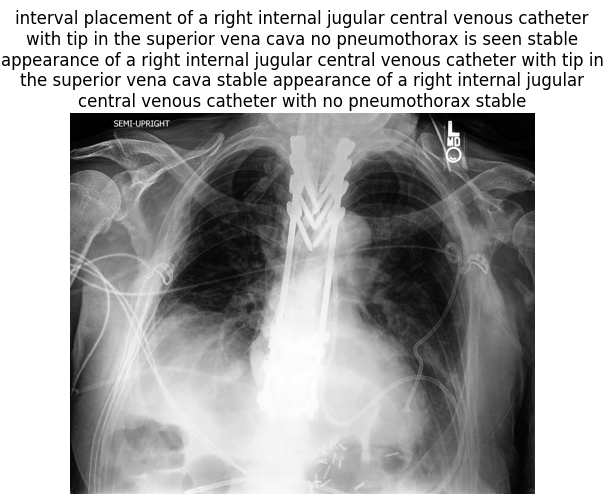


Running Validation...
------------------------------


Validation Epoch 1: 100%|██████████| 1762/1762 [22:31<00:00,  1.30it/s, Val Loss=1.5625]


Validation Loss: 1.0186
Saved new best model.

Epoch 2/10


Epoch 2:  11%|█▏        | 200/1762 [03:02<23:16,  1.12it/s, Loss=1.21] 

Batch 200/1762 | Loss: 1.2090


Epoch 2:  23%|██▎       | 400/1762 [05:55<22:20,  1.02it/s, Loss=0.901]

Batch 400/1762 | Loss: 0.9009


Epoch 2:  34%|███▍      | 600/1762 [08:45<17:44,  1.09it/s, Loss=1.15] 

Batch 600/1762 | Loss: 1.1504


Epoch 2:  45%|████▌     | 800/1762 [11:39<14:15,  1.12it/s, Loss=1.27] 

Batch 800/1762 | Loss: 1.2734


Epoch 2:  57%|█████▋    | 1000/1762 [14:32<11:56,  1.06it/s, Loss=1.13]

Batch 1000/1762 | Loss: 1.1299


Epoch 2:  68%|██████▊   | 1200/1762 [17:24<08:14,  1.14it/s, Loss=1.12] 

Batch 1200/1762 | Loss: 1.1230


Epoch 2:  79%|███████▉  | 1400/1762 [20:10<05:52,  1.03it/s, Loss=0.55] 

Batch 1400/1762 | Loss: 0.5498


Epoch 2:  91%|█████████ | 1600/1762 [23:02<02:37,  1.03it/s, Loss=0.688]

Batch 1600/1762 | Loss: 0.6885


Epoch 2: 100%|██████████| 1762/1762 [25:17<00:00,  1.16it/s, Loss=1.44] 


Epoch 2 Completed. Average Training Loss: 1.0497
Image Path: /cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val/02275-4-Frontal-AP-51.0-Male-White.png


Both `max_new_tokens` (=72) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


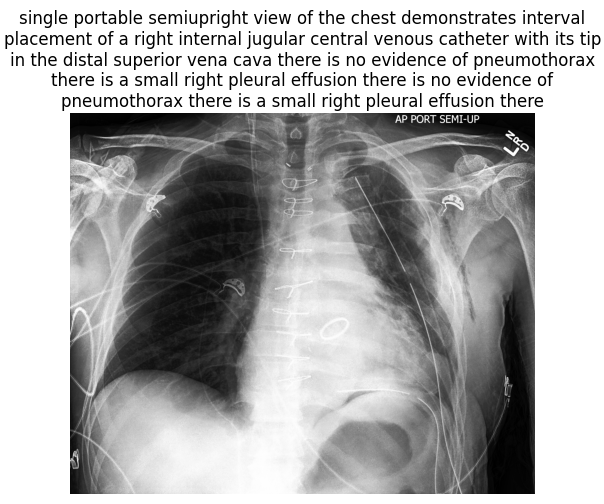


Running Validation...
------------------------------


Validation Epoch 2: 100%|██████████| 1762/1762 [22:25<00:00,  1.31it/s, Val Loss=1.1016]


Validation Loss: 0.9544
Saved new best model.

Epoch 3/10


Epoch 3:  11%|█▏        | 200/1762 [02:50<22:34,  1.15it/s, Loss=0.978]

Batch 200/1762 | Loss: 0.9780


Epoch 3:  23%|██▎       | 400/1762 [05:41<18:20,  1.24it/s, Loss=1.22] 

Batch 400/1762 | Loss: 1.2207


Epoch 3:  34%|███▍      | 600/1762 [08:39<16:46,  1.15it/s, Loss=0.887]

Batch 600/1762 | Loss: 0.8872


Epoch 3:  45%|████▌     | 800/1762 [11:30<15:39,  1.02it/s, Loss=0.804]

Batch 800/1762 | Loss: 0.8042


Epoch 3:  57%|█████▋    | 1000/1762 [14:22<11:18,  1.12it/s, Loss=0.998]

Batch 1000/1762 | Loss: 0.9976


Epoch 3:  68%|██████▊   | 1200/1762 [17:20<09:15,  1.01it/s, Loss=1.18] 

Batch 1200/1762 | Loss: 1.1787


Epoch 3:  79%|███████▉  | 1400/1762 [20:18<05:18,  1.14it/s, Loss=1.07] 

Batch 1400/1762 | Loss: 1.0674


Epoch 3:  91%|█████████ | 1600/1762 [23:15<02:33,  1.05it/s, Loss=0.76] 

Batch 1600/1762 | Loss: 0.7598


Epoch 3: 100%|██████████| 1762/1762 [25:36<00:00,  1.15it/s, Loss=1.04] 


Epoch 3 Completed. Average Training Loss: 1.0178
Image Path: /cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val/50357-3-Frontal-AP-66.0-Female-White.png


Both `max_new_tokens` (=72) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


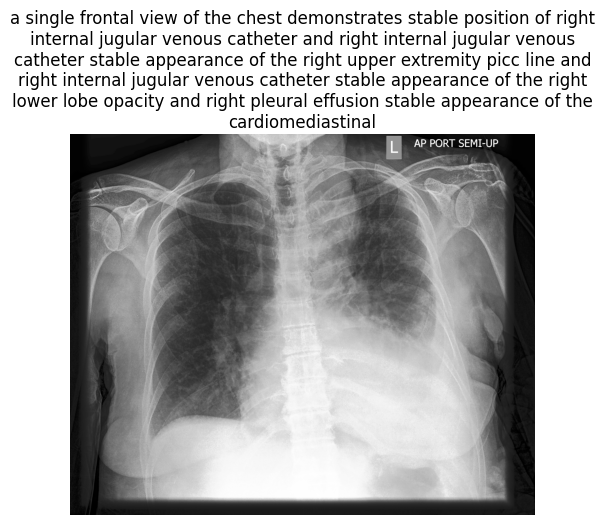


Running Validation...
------------------------------


Validation Epoch 3: 100%|██████████| 1762/1762 [22:44<00:00,  1.29it/s, Val Loss=1.3857]


Validation Loss: 0.9422
Saved new best model.

Epoch 4/10


Epoch 4:  11%|█▏        | 200/1762 [02:58<24:40,  1.06it/s, Loss=1.29] 

Batch 200/1762 | Loss: 1.2900


Epoch 4:  23%|██▎       | 400/1762 [05:43<19:05,  1.19it/s, Loss=1.11] 

Batch 400/1762 | Loss: 1.1064


Epoch 4:  34%|███▍      | 600/1762 [08:34<15:31,  1.25it/s, Loss=1.09] 

Batch 600/1762 | Loss: 1.0879


Epoch 4:  45%|████▌     | 800/1762 [11:19<14:20,  1.12it/s, Loss=1.28] 

Batch 800/1762 | Loss: 1.2793


Epoch 4:  57%|█████▋    | 1000/1762 [14:12<11:44,  1.08it/s, Loss=0.902]

Batch 1000/1762 | Loss: 0.9019


Epoch 4:  68%|██████▊   | 1200/1762 [17:06<08:50,  1.06it/s, Loss=0.599]

Batch 1200/1762 | Loss: 0.5986


Epoch 4:  79%|███████▉  | 1400/1762 [19:50<04:22,  1.38it/s, Loss=1.05] 

Batch 1400/1762 | Loss: 1.0537


Epoch 4:  91%|█████████ | 1600/1762 [23:05<03:27,  1.28s/it, Loss=0.599]

Batch 1600/1762 | Loss: 0.5986


Epoch 4: 100%|██████████| 1762/1762 [25:41<00:00,  1.14it/s, Loss=0.72] 


Epoch 4 Completed. Average Training Loss: 1.0029
Image Path: /cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val/04410-4-Frontal-AP-78.0-Female-Other.png


Both `max_new_tokens` (=72) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


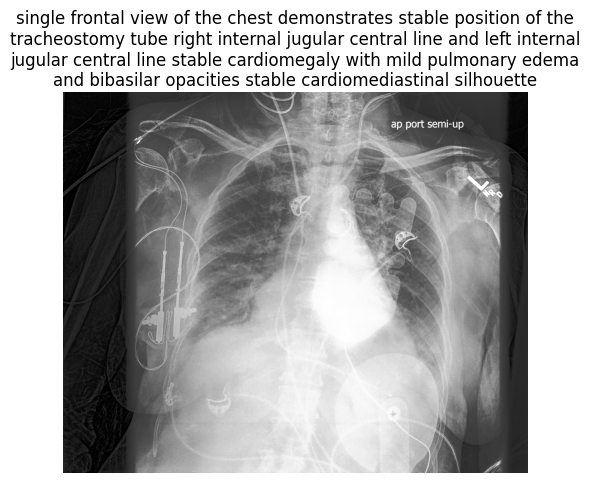


Running Validation...
------------------------------


Validation Epoch 4:   6%|▌         | 109/1762 [01:38<24:52,  1.11it/s, Val Loss=1.0098]


KeyboardInterrupt: 

In [ ]:
import torch
from tqdm import tqdm

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
num_epochs = 10
best_val_loss = float('inf')
device = "cuda" if torch.cuda.is_available() else "cpu"

model.train()
# eval_dataloader = train_dataloader
total_batches = len(train_dataloader)  # Total batches per epoch

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch + 1}/{num_epochs}\n" + "="*30)
    
    epoch_loss = 0.0  # Track total loss per epoch
    progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch + 1}", leave=True)
    
    for idx, batch in enumerate(progress_bar):
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device, torch.float16)

        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=input_ids)
        loss = outputs.loss

        # Accumulate epoch loss
        epoch_loss += loss.item()

        # Update the progress bar description
        progress_bar.set_postfix({"Loss": loss.item()})

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        # Display loss every 20 batches
        if (idx + 1) % 200 == 0:
            print(f"Batch {idx + 1}/{total_batches} | Loss: {loss.item():.4f}")
            

    # End-of-epoch training loss
    avg_train_loss = epoch_loss / total_batches
    print(f"Epoch {epoch + 1} Completed. Average Training Loss: {avg_train_loss:.4f}")
    generate_rand()
   
    # ===================
    # Validation Phase
    # ===================
    model.eval()
    val_loss_sum = 0.0
    num_batches = len(eval_dataloader)

    print("\nRunning Validation...\n" + "-"*30)
    val_progress_bar = tqdm(eval_dataloader, desc=f"Validation Epoch {epoch + 1}", leave=True)

    with torch.no_grad():
        for batch in val_progress_bar:
            input_ids = batch.pop("input_ids").to(device)
            pixel_values = batch.pop("pixel_values").to(device, torch.float16)

            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=input_ids)
            batch_loss = outputs.loss.item()
            val_loss_sum += batch_loss

            # Update validation progress bar
            val_progress_bar.set_postfix({"Val Loss": f"{batch_loss:.4f}"})

    avg_val_loss = val_loss_sum / num_batches
    print(f"Validation Loss: {avg_val_loss:.4f}")

    # Save the best model based on validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), 'blip_best_model_.pth')
        print("Saved new best model.")

    # Switch back to training mode
    model.train()

print("Training complete.")

### Rest

In [7]:

import torch

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
num_epochs = 1

best_val_loss = float('inf')
device = "cuda" if torch.cuda.is_available() else "cpu"

model.train()
eval_dataloader = train_dataloader

for epoch in range(num_epochs):
    print("Epoch:", epoch)
    for idx, batch in enumerate(train_dataloader):
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device, torch.float16)

        outputs = model(input_ids=input_ids,
        pixel_values=pixel_values,
        labels=input_ids)

        loss = outputs.loss

        print(f'{idx}/{36834 // batch_size} Batch Processed. Loss: {loss.item()}')

        loss.backward()

        optimizer.step()
        optimizer.zero_grad()

        # display_generated_captions()

    # Evaluation phase
    model.eval()
    val_loss_sum = 0.0
    num_batches = 0
    with torch.no_grad():
        for batch in eval_dataloader:
            input_ids = batch.pop("input_ids").to(device)
            pixel_values = batch.pop("pixel_values").to(device, torch.float16)

            outputs = model(input_ids=input_ids,
                            pixel_values=pixel_values,
                            labels=input_ids)

            val_loss_sum += outputs.loss.item()
            num_batches += 1

    avg_val_loss = val_loss_sum / num_batches
    print(f"Validation Loss: {avg_val_loss}")

    # Save the best model based on validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print("Saved new best model.")


    display_generated_captions()

print("Training complete.")

Epoch: 0
0/4604 Batch Processed. Loss: 4.9375
1/4604 Batch Processed. Loss: 4.66015625
2/4604 Batch Processed. Loss: 4.61328125
3/4604 Batch Processed. Loss: 4.671875
4/4604 Batch Processed. Loss: 4.73828125
5/4604 Batch Processed. Loss: 4.109375
6/4604 Batch Processed. Loss: 4.11328125
7/4604 Batch Processed. Loss: 3.921875
8/4604 Batch Processed. Loss: 4.01171875
9/4604 Batch Processed. Loss: 3.916015625
10/4604 Batch Processed. Loss: 3.693359375
11/4604 Batch Processed. Loss: 3.712890625
12/4604 Batch Processed. Loss: 3.734375
13/4604 Batch Processed. Loss: 3.525390625
14/4604 Batch Processed. Loss: 3.33203125
15/4604 Batch Processed. Loss: 3.388671875
16/4604 Batch Processed. Loss: 3.419921875
17/4604 Batch Processed. Loss: 3.208984375
18/4604 Batch Processed. Loss: 3.2265625
19/4604 Batch Processed. Loss: 2.9921875
20/4604 Batch Processed. Loss: 3.140625
21/4604 Batch Processed. Loss: 3.08984375
22/4604 Batch Processed. Loss: 2.98828125
23/4604 Batch Processed. Loss: 3.08203125
24

KeyboardInterrupt: 

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.
`low_cpu_mem_usage` was None, now default to True since model is quantized.
Loading checkpoint shards: 100%|██████████| 8/8 [00:30<00:00,  3.79s/it]


trainable params: 5,242,880 || all params: 3,749,922,816 || trainable%: 0.1398


Expanding inputs for image tokens in BLIP-2 should be done in processing. Please follow instruction here (https://gist.github.com/zucchini-nlp/e9f20b054fa322f84ac9311d9ab67042) to update your BLIP-2 model. Using processors without these attributes in the config is deprecated and will throw an error in v4.50.
Both `max_new_tokens` (=50) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


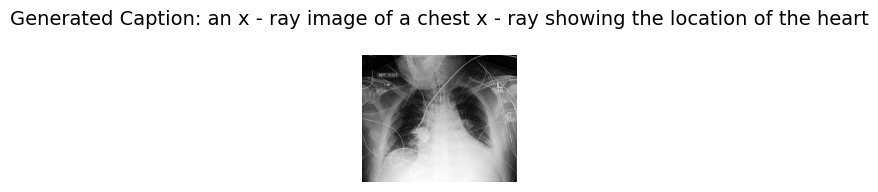

Both `max_new_tokens` (=50) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


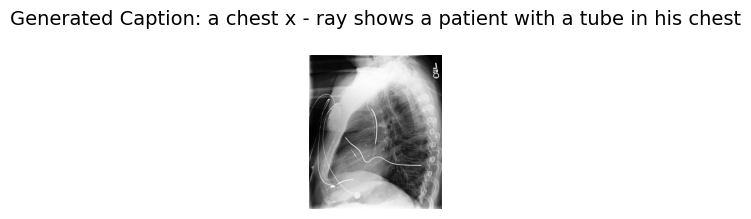

Both `max_new_tokens` (=50) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


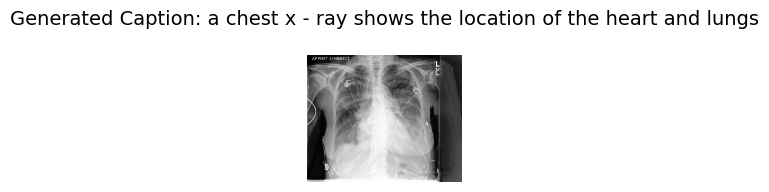

Both `max_new_tokens` (=50) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


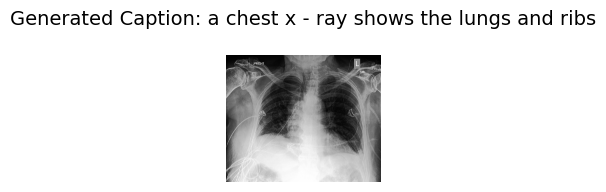

Both `max_new_tokens` (=50) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


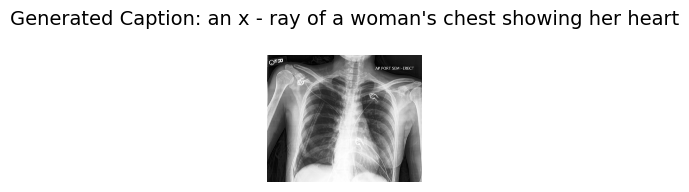

Both `max_new_tokens` (=50) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


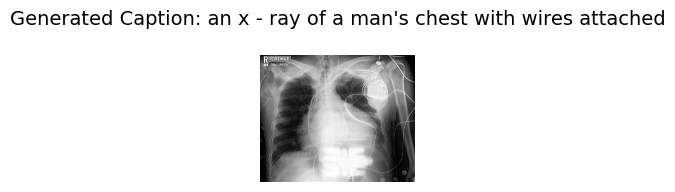

In [10]:

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("ybelkada/blip2-opt-2.7b-fp16-sharded", load_in_8bit=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# Let's define the LoraConfig
config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

model = get_peft_model(model, config)
model.print_trainable_parameters()

display_generated_captions()

In [1]:
from torch.utils.data import Dataset
from PIL import Image
import cv2
import os
import jsonlines
import os
import jsonlines
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torch
import numpy as np 
import matplotlib.pyplot as plt
import cv2
from transformers import BlipForConditionalGeneration, BlipProcessor, Blip2ForConditionalGeneration, AutoProcessor
from peft import LoraConfig, get_peft_model
from torch.utils.data import Dataset, DataLoader

# Load the BLIP processor
# processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
# model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("ybelkada/blip2-opt-2.7b-fp16-sharded", load_in_8bit=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# Let's define the LoraConfig
config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

model = get_peft_model(model, config)
model.print_trainable_parameters()
model.load_state_dict(torch.load('best_model.pth'))

2024-08-14 01:24:36.756152: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-14 01:24:36.774190: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-14 01:24:36.791910: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-14 01:24:36.798001: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-14 01:24:36.813198: I tensorflow/core/platform/cpu_feature_guar

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

trainable params: 5,242,880 || all params: 3,749,922,816 || trainable%: 0.1398


<All keys matched successfully>

('2890_1078945321_04_WRI-L1_M006.png', '7 years old Male. A fracture with significant swelling and bruising detected, indicative of acute injury.')


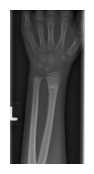

('3772_0528790059_01_WRI-R2_M004-0.png', '0 years old Male. No abnormal findings detected; the scan is clear.')


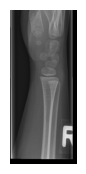

('5323_0461263091_01_WRI-L2_F008.png', '9 years old Female. No significant findings detected.')


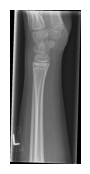

('1832_0499325314_02_WRI-L2_M011.png', '9 years old Male. Fracture with associated soft tissue injury detected, further evaluation of neurovascular status.')


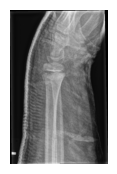

('4994_0107525334_01_WRI-R1_M012.png', '10 years old Male. Fracture with associated soft tissue injury detected, further evaluation of neurovascular status needed.')


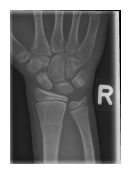

('2280_1133036521_01_WRI-L1_M012-0.png', '0 years old Female. No abnormal or unusual findings; the image is within normal parameters.')


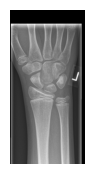

('4807_0390013963_02_WRI-L1_M009.png', '9 years old Male. Fracture with periosteal reaction noted, indicating possible chronicity.')


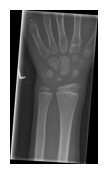

('1083_0653990085_02_WRI-R1_M009.png', '9 years old Male. Fracture with associated soft tissue injury detected, further evaluation of neurovascular status needed.')


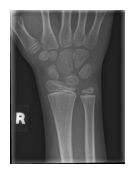

('1605_1015437218_04_WRI-L1_M016.png', '15 years old Male. Fracture with associated soft tissue injury detected, further evaluation of neurovascular status needed.,')


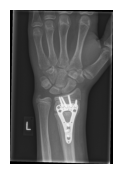

('2529_0907428046_01_WRI-R1_M014.png', '15 years old Male. Fracture with associated soft tissue injury detected, further evaluation of neurovascular status needed.')


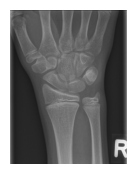

('0940_0962670675_01_WRI-R2_F008.png', '9 years old Male. Fracture with periosteal callus formation detected, often requiring surgical intervention.')


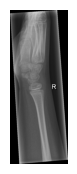

('6087_0425606666_01_WRI-L2_F012.png', '12 years old Male. Fracture with periosteal reaction noted, indicating possible chronicity.')


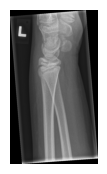

('5315_0764718474_01_WRI-R2_F011.png', '12 years old Female. Fracture with associated joint dislocation detected, urgent reduction may be necessary.')


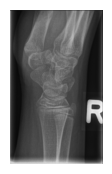

('5996_1191043595_01_WRI-R2_M008.png', '7 years old Male. Fracture with associated soft tissue injury detected, further evaluation of neurovascular status needed.')


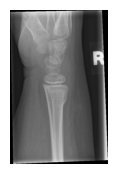

KeyboardInterrupt: 

In [2]:
def display_generated_captions(num_samples=5):
    test_imgs = os.listdir("/cluster/home/ammaa/Downloads/report_generation/validation")

    for i, img in enumerate(test_imgs):
        image_path = f"/cluster/home/ammaa/Downloads/report_generation/validation/{img}"
        img = cv2.imread(image_path)
        img = img[:, :, ::-1] # BGR to RGB.
        image = Image.fromarray(img)

        inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
        pixel_values = inputs.pixel_values

        generated_ids = model.generate(pixel_values=pixel_values, max_length=25)
        generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
     

        # Display the image and caption
        plt.figure(figsize=(2, 2))
        plt.imshow(image)
        # plt.title(f"Generated Caption: {generated_caption}", fontsize=14)
        print(f'{test_imgs[i], generated_caption}')
        plt.axis('off')
        plt.show()

        if i == num_samples: break
        
display_generated_captions(num_samples=20)

In [6]:

image_path = "/cluster/home/ammaa/Downloads/report_generation/Xnip2024-08-14_01-35-01.png"

img = cv2.imread(image_path)
img = img[:, :, ::-1] # BGR to RGB.
image = Image.fromarray(img)

inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
pixel_values = inputs.pixel_values

generated_ids = model.generate(pixel_values=pixel_values, max_length=25)
generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

print(generated_caption)

0 years old Female. No abnormal findings detected; the scan is clear.
